In [1]:
#@title init
import io
import os, time
import pickle
import shutil
import numpy as np
# os.environ['PYTORCH_ENABLE_MPS_FALLBACK'] = '1'
import torch
import torch.nn.functional as F
import sys
import shutil
import torchvision.transforms.functional as TF
from torchvision.transforms import Compose, Resize, ToTensor, Normalize
from sklearn.model_selection import train_test_split
import csv
import numpy as np
import pandas as pd
import PIL.Image
from PIL import Image, ImageDraw
import IPython.display
import matplotlib.pyplot as plt
from pathlib import Path
from tqdm import tqdm
from ipywidgets import interact, Button, FloatSlider, Layout
import sys

import torch
import torch.nn.functional as F
import requests
import torchvision.transforms as transforms
import torchvision.transforms.functional as TF
import copy
import unicodedata
import re
from PIL import Image
from tqdm.notebook import tqdm
from torchvision.transforms import Compose, Resize, ToTensor, Normalize
from IPython.display import display
from einops import rearrange
from time import perf_counter
# !pip install einops plotly tqdm scikit-learn x_transformers 
# df = pd.read_hdf('coords_wlosses.h5')





df = pd.read_csv('/Users/adamsobieszek/PycharmProjects/psychGAN/content/coords_wlosses.csv')

In [2]:
import torch
import torch.nn as nn
import numpy as np
import pandas as pd
from pathlib import Path
from torchvision.transforms import Compose, Resize
import torchvision.transforms.functional as TF
from typing import List, Dict, Union, Tuple
%cd /Users/adamsobieszek/PycharmProjects/_manipy/
# Assuming the existence of these from a library like torchdyn
os.environ['PATH'] = os.environ['PATH']+':/opt/anaconda3/envs/manip311/'
print(os.environ['PATH'])


from manipy.models.flow_models import VectorFieldTransformer, RatingODE
from manipy.models.layers import EnsembleRegressor, MeanRegressor
from manipy.models.rating_models import AlphaBetaRegressor

final_models_path = "/Users/adamsobieszek/PycharmProjects/psychGAN/content/"


import locale

locale.getpreferredencoding = lambda: "UTF-8"
device= "cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu"




class From100To1(nn.Module):
  def __init__(self, model):
     super().__init__()
     self.model = model

  def forward(self, x):
     return self.model(x)/100

# del control_models
if not "control_models" in dir():
  # if not os.path.exists("final_models.zip"):
  #   !gdown 1pPjOd-mx-d-vOw1QR_lpJoJmLAGdkI3W
  #   !unzip final_models.zip
  #   !unzip final_models.zip
  control_names = ['trustworthy','dominant', 'gender', 'age', 'white', 'happy']
  control_models = [EnsembleRegressor([MeanRegressor(512,1) for _ in range(8)], model_kwargs={}).to(device) for label in control_names]
  for m,l in zip(control_models,control_names):
    m.load_state_dict(torch.load(f"{final_models_path}/final_models/ensemble_{l}.pt", map_location=torch.device("mps")))
    m.eval()
  ALL_MODELS = {**{l:From100To1(m) for l,m in zip(control_names,control_models)}}


# G, face_w, device = setup_stylegan()
# G, face_w, device = setup_stylegan()
sys.path.append('/Users/adamsobieszek/PycharmProjects/_manipy')
from mapping_network import *

DEVICE = torch.device('mps')

mapping = MappingNetwork(512,0,512,18).to(DEVICE)
mapping.load_state_dict(torch.load("/Users/adamsobieszek/PycharmProjects/_manipy/mapping_network/map (1).pt", weights_only=True, map_location=DEVICE))
class MockGenerator(nn.Module):
    mapping = mapping


G = MockGenerator().eval().to(DEVICE)
G = torch.compile(G, )
start_time = time.time()
print(G.mapping.w_avg.shape)
all_z = torch.randn([1, G.mapping.z_dim], device=device)
face_w = G.mapping(all_z, None, truncation_psi=0.5)
dim = "trustworthy"


w_avg = G.mapping.w_avg

ALL_MODELS['trustworthy'](w_avg.reshape(1,512).to(device))



sys.path.append('/Users/adamsobieszek/PycharmProjects/psychGAN/content/psychGAN/stylegan3')
with open('/Users/adamsobieszek/PycharmProjects/psychGAN/stylegan2-ffhq-1024x1024.pkl', 'rb') as fp:
    G = pickle.load(fp)['G_ema'].to(device)

# Compute the average latent vector
all_z = torch.randn([1, G.mapping.z_dim], device=device)
face_w = G.mapping(all_z, None, truncation_psi=0.5)


/Users/adamsobieszek/PycharmProjects/_manipy
/opt/anaconda3/envs/manip311/bin:/opt/homebrew/Cellar/openjdk@21/21.0.8/libexec/openjdk.jdk/Contents/Home/bin:/Users/adamsobieszek/.local/bin:/Users/adamsobieszek/Library/Android/sdk/platform-tools:/Users/adamsobieszek/Library/Android/sdk/emulator:/Users/adamsobieszek/Library/Android/sdk/cmdline-tools/latest/bin:/Users/adamsobieszek/google-cloud-sdk/bin:/opt/homebrew/bin:/opt/homebrew/sbin:/opt/anaconda3/envs/manip311/bin:/opt/anaconda3/condabin:/usr/local/bin:/System/Cryptexes/App/usr/bin:/usr/bin:/bin:/usr/sbin:/sbin:/var/run/com.apple.security.cryptexd/codex.system/bootstrap/usr/local/bin:/var/run/com.apple.security.cryptexd/codex.system/bootstrap/usr/bin:/var/run/com.apple.security.cryptexd/codex.system/bootstrap/usr/appleinternal/bin:/Library/Apple/usr/bin:/usr/local/MacGPG2/bin:/Library/TeX/texbin:/opt/anaconda3/envs/manip311/
torch.Size([512])


# Attractive

.

.

.

.

.

.



















In [3]:
def pad_list(l, max_len):
    return l[:max_len] + [np.nan] * (max_len - len(l[:max_len]))
    
def prepare_data2(config: dict, verbose=False):
    xs, ys = photo_to_coords, dim_to_photo_to_ratings[config['data']['attribute_dim']]
    imgs = set(ys.keys()).intersection(set(xs.keys()))-set('638.jpg')
    X = torch.stack([xs[k] for k in imgs]).to(DEVICE, DTYPE)
    max_len = int(max(len(ys[k]) for k in imgs) * config['data'].get('rating_oversampling_factor', 1.0))
    y = torch.tensor([pad_list(ys[k], max_len) for k in imgs], device=DEVICE, dtype=DTYPE)
    n = y.shape[1] - y.isnan().sum(dim=1)
    sample_size_weights = (n.reshape(-1)) 
    sample_size_weights = sample_size_weights / sample_size_weights.sum()*len(n)
    from sklearn.neighbors import KernelDensity
    kde = KernelDensity(kernel='gaussian', bandwidth=.5).fit(torch.nanmean(y, dim=1).cpu().numpy().reshape(-1,1))
    log_dens = kde.score_samples(torch.nanmean(y, dim=1).cpu().numpy().reshape(-1,1))
    weights = (np.exp(-log_dens))
    weights = torch.tensor(weights/np.sum(weights)*len(n), device=DEVICE, dtype=DTYPE)

    # pressure = torch.sigmoid(torch.nanmean(y, dim=1, keepdim=True))*(1-torch.sigmoid(torch.nanmean(y, dim=1, keepdim=True)))
    # pressure = pressure / pressure.sum()*len(n)
    # weights = sample_size_weights*pressure
    # weights = weights**2
    # weights = weights / weights.sum()*len(n)
    return X, y, weights

psychGAN_path = "/Users/adamsobieszek/PycharmProjects/psychGAN/"
photo_to_coords = np.load(psychGAN_path+"photo_to_coords.npy", allow_pickle=True)
dim_to_photo_to_ratings = np.load(psychGAN_path+"dim_to_photo_to_ratings.npy", allow_pickle=True)





In [4]:
#@title TUTAJ SIĘ ZAPISUJA INPUTY
import torch
import numpy as np
import matplotlib.pyplot as plt
from torchvision.transforms import Compose, Resize
import torchvision.transforms.functional as TF
from ipywidgets import interact, Button
from IPython.display import display

# This is a placeholder for the actual models and data preparation functions
# that would be defined in a complete notebook environment.
# In a real scenario, ensure that G, model, control_models, device,
# directions, CIs, face_w, etc., are properly loaded and initialized.
# For example:
# from models import AlphaBetaRegressor, EnsembleRegressor, RatingODE
# from data_utils import prepare_data
# from torchdiffeq import odeint_adjoint as NeuralODE
# G, model, device, control_models = None, None, torch.device('cpu'), [None]*3
# directions, CIs = {}, {}
# face_w = torch.randn(1, 512)
# dim = "attractive"

@torch.no_grad()
def manipulation_showcase(coeff_vec):
        """
        Generates and displays facial manipulations based on two different vectors.

        This function takes a latent vector representing a face and manipulates it
        in positive and negative directions using a standard direction vector and a
        Covariance-Informed (CI) vector. It then generates and plots the resulting
        images in a 2x3 grid for comparison.

        Args:
            coeff_vec (float): The coefficient to scale the manipulation vectors.
        """
        # try:
        global G, model, device, directions, CIs, face_w

        # Prepare original latent vector by tiling it for all 18 layers
        original_face_w = torch.stack([face_w.clone().view(1, 512)] * 18, dim=1)
        w_orig_base = original_face_w[:, 0]

        # Get and normalize the primary direction vector
        direction = -directions[dim].to(device)
        direction /= direction.norm()

        # Get and normalize the Covariance-Informed (CI) vector
        ci = -CIs[dim].to(device).view(direction.shape)
        ci /= ci.norm()
        # # --- Orthogonal Projection Step ---
        # # Project the direction vector to be orthogonal to age and gender to
        # # disentangle the attribute manipulation from those characteristics.
        # with torch.enable_grad():
        #   w = w_orig_base.requires_grad_(True)
        #   ages = control_models[2](w)
        #   ages.sum().backward()
        #   age_grad = w.grad.detach()
        #   age_grad_unit = age_grad.view(-1) / age_grad.norm()
        #   direction -= torch.dot(direction.view(-1), age_grad_unit) * age_grad_unit
        #   ci -= torch.dot(ci.view(-1), age_grad_unit.view(-1)) * age_grad_unit

        #   w.grad = None
        #   w = w.requires_grad_(True)
        #   ages = control_models[1](w)
        #   ages.sum().backward()
        #   gender_grad = w.grad.detach()

        #   gender_grad_unit = gender_grad.view(-1) / gender_grad.norm()
        #   direction -= torch.dot(direction.view(-1), gender_grad_unit.view(-1)) * gender_grad_unit
        #   ci -= torch.dot(ci.view(-1), gender_grad_unit.view(-1)) * gender_grad_unit

        #   # 5. Re-normalize the final projected direction vector
        #   direction /= direction.norm()
        #   ci /= ci.norm()
        #   # --- End of Projection Step ---
        # with torch.enable_grad():
        #   w = (w_orig_base + direction/2).detach().requires_grad_(True)
        #   ages = control_models[2](w)
        #   ages.sum().backward()
        #   age_grad = w.grad.detach()
        #   age_grad_unit = age_grad.view(-1) / age_grad.norm()
        #   direction -= torch.dot(direction.view(-1), age_grad_unit) * age_grad_unit
        #   ci -= torch.dot(ci.view(-1), age_grad_unit.view(-1)) * age_grad_unit

        #   w.grad = None
        #   w = w.requires_grad_(True)
        #   ages = control_models[1](w)
        #   ages.sum().backward()
        #   gender_grad = w.grad.detach()

        #   gender_grad_unit = gender_grad.view(-1) / gender_grad.norm()
        #   direction -= torch.dot(direction.view(-1), gender_grad_unit.view(-1)) * gender_grad_unit
        #   ci -= torch.dot(ci.view(-1), gender_grad_unit.view(-1)) * gender_grad_unit

        #   # 5. Re-normalize the final projected direction vector
        #   direction /= direction.norm()
        #   ci /= ci.norm()
        #   # --- End of Projection Step ---
        # with torch.enable_grad():
        #   w = (w_orig_base + ci/2).detach().requires_grad_(True)
        #   ages = control_models[2](w)
        #   ages.sum().backward()
        #   age_grad = w.grad.detach()
        #   age_grad_unit = age_grad.view(-1) / age_grad.norm()
        #   direction -= torch.dot(direction.view(-1), age_grad_unit) * age_grad_unit
        #   ci -= torch.dot(ci.view(-1), age_grad_unit.view(-1)) * age_grad_unit

        #   w.grad = None
        #   w = w.requires_grad_(True)
        #   ages = control_models[1](w)
        #   ages.sum().backward()
        #   gender_grad = w.grad.detach()

        #   gender_grad_unit = gender_grad.view(-1) / gender_grad.norm()
        #   direction -= torch.dot(direction.view(-1), gender_grad_unit.view(-1)) * gender_grad_unit
        #   ci -= torch.dot(ci.view(-1), gender_grad_unit.view(-1)) * gender_grad_unit

        #   # 5. Re-normalize the final projected direction vector
        #   direction /= direction.norm()
        #   ci /= ci.norm()
        #   # --- End of Projection Step ---

        # Calculate positive and negative displacements for both vectors
        pos_vector_direction = direction * coeff_vec
        neg_vector_direction = direction * -coeff_vec
        pos_ci_direction = ci * coeff_vec
        neg_ci_direction = ci * -coeff_vec

        # Create latent codes for all 5 variations (original + 4 manipulations)
        w_orig_base = original_face_w[:, 0]
        neg_vector_w = torch.stack([w_orig_base + neg_vector_direction] * 18, dim=1)
        pos_vector_w = torch.stack([w_orig_base + pos_vector_direction] * 18, dim=1)
        neg_ci_w = torch.stack([w_orig_base + neg_ci_direction] * 18, dim=1)
        pos_ci_w = torch.stack([w_orig_base + pos_ci_direction] * 18, dim=1)

        # Stack all latent vectors for batch processing
        stacked_w = torch.stack([
            neg_vector_w, pos_vector_w, original_face_w, neg_ci_w, pos_ci_w
        ])

        # Generate all images at once
        images = G.synthesis(stacked_w.view(-1, 18, 512)).cpu()

        # Define image post-processing transform
        tf = Compose([
            Resize(512),
            lambda x: torch.clamp((x + 1) / 2, min=0, max=1),
        ])

        # Convert tensors to PIL images
        images_pil = [TF.to_pil_image(tf(img)) for img in images]
        img_neg_vec, img_pos_vec, img_orig, img_neg_ci, img_pos_ci = images_pil

        # Calculate beauty ratings and age for all images
        ratings = model(stacked_w[:, 0, 0], 'mean').cpu().numpy().flatten()
        ages = control_models[2](stacked_w[:, 0, 0]).cpu().numpy().flatten()
        (mean_neg_vec, mean_pos_vec, mean_original, mean_neg_ci, mean_pos_ci) = ratings
        (age_neg_vec, age_pos_vec, age_original, age_neg_ci, age_pos_ci) = ages



        # Create a 2x3 subplot for displaying the results
        fig, ax = plt.subplots(2, 3, figsize=(21, 14))

        # --- Top Row: Standard Vector Manipulation ---
        CAPTION = False
        vec_dist = f"Distance: {(w_orig_base - neg_vector_w[:, 0]).norm():.2f}"

        # Plot 1: Negative Vector Manipulation
        ax[0, 0].imshow(img_neg_vec)
        ax[0, 0].set_title("Direction (-)")
        def caption(ax, text):
            if CAPTION:
                ax.text(0.5, 0.05, text,
                        ha='center', va='center', transform=ax.transAxes, color='white', fontsize=14,
                        bbox=dict(facecolor='black', alpha=0.7))
        
        caption(ax[0, 0], f'ΔRating: {(mean_neg_vec - mean_original) * 100:.2f}\nΔAge: {(age_neg_vec - age_original):.2f}\n{vec_dist}')
        ax[0, 0].axis('off')

        # Plot 2: Original Image
        ax[0, 1].imshow(img_orig)
        ax[0, 1].set_title("Original Image")
        caption(ax[0, 1], f'Rating: {mean_original * 100:.2f}\nAge: {age_original:.2f}')
        ax[0, 1].axis('off')

        # Plot 3: Positive Vector Manipulation
        ax[0, 2].imshow(img_pos_vec)
        ax[0, 2].set_title("Direction (+)")
        caption(ax[0, 2], f'ΔRating: {(mean_pos_vec - mean_original) * 100:.2f}\nΔAge: {(age_pos_vec - age_original):.2f}\n{vec_dist}')
        ax[0, 2].axis('off')

        # --- Bottom Row: CI Vector Manipulation ---

        # Plot 4: Negative CI Manipulation
        ax[1, 0].imshow(img_neg_ci)
        ax[1, 0].set_title("CI (-)")
        ci_dist = f"Distance: {(w_orig_base - neg_ci_w[:, 0]).norm():.2f}"
        caption(ax[1, 0], f'ΔRating: {(mean_neg_ci - mean_original) * 100:.2f}\nΔAge: {(age_neg_ci - age_original):.2f}\n{ci_dist}')
        ax[1, 0].axis('off')

        # Plot 5: Original Image (repeated for context)
        ax[1, 1].imshow(img_orig)
        ax[1, 1].set_title("Original Image")
        caption(ax[1, 1], f'Rating: {mean_original * 100:.2f}\nAge: {age_original:.2f}')
        ax[1, 1].axis('off')

        # Plot 6: Positive CI Manipulation
        ax[1, 2].imshow(img_pos_ci)
        ax[1, 2].set_title("CI (+)")
        caption(ax[1, 2], f'ΔRating: {(mean_pos_ci - mean_original) * 100:.2f}\nΔAge: {(age_pos_ci - age_original):.2f}\n{ci_dist}')
        ax[1, 2].axis('off')

        plt.tight_layout()
        plt.show()
    # except Exception as ex:
    #     print(f"An error occurred: {ex}")
    #     return

def on_button_clicked(b):
    """Handles the face change button click event."""
    global traj_all, face_w, i_w
    # if i_w % 50 == 0:
    #     print("Generating new set of faces...")
    #     regen()
    i = i_w % 50
    # face_w = traj_all[:, i:i+1]
    face_w = init_w
    i_w += 1
    try:
        interactive_display.widget.update()
    except Exception as e:
        print(f"Could not update widget: {e}")

def grad(w, model, kwargs={}):
    """Computes the gradient of a model's output with respect to the input."""
    w = w.detach().clone().requires_grad_(True)
    output = model(w, **kwargs)
    torch.sum(output).backward()
    return w.grad.detach()


def regen():
    """Resets and regenerates the base face and trajectory."""
    global face_w, i_w, traj, node, traj_all, max_rating
    with torch.no_grad():
        # i_w = 0 # Uncomment to reset face counter
        # face_w = G.mapping.w_avg # Start from the average face
        traj = None
        # Example of trajectory generation (requires pre-configured 'node' and 'max_rating')
        # traj_all = node.trajectory(
        #     face_w,
        #     t_span=torch.linspace(0, max_rating, 100),
        # )

# --- Main execution block ---
# This block should contain the model loading and setup logic from your notebook.
# It is reproduced here based on the original script's structure.

# Initialize counters and data storage
i_w = 0
dataset = {}
dim = "trustworthy" # or "trustworthy"

# Assuming CONFIG, prepare_data, and necessary model classes are defined
# config = CONFIG.copy()
# config['data']['attribute_dim'] = dim
# X, y = prepare_data(config)
# y = -y

# # Perform PCA and calculate the Covariance-Informed gradient
# from sklearn.decomposition import PCA
# from sklearn.linear_model import LinearRegression
# X_full = sample_w(10000).detach().cpu().numpy()
  #G.mapping.w_avg # Fallback to average face

# Load models
# model_path = "/Users/adamsobieszek/PycharmProjects/psychGAN/"
# models = [AlphaBetaRegressor(dim=512).to(device) for _ in range(8)]
# model_files = [f"{model_path}best_models/model_{dim}_v{3+i}.pt" for i in range(8)]
# for i, m_file in enumerate(model_files):
#     models[i].load_state_dict(torch.load(m_file, map_location=device))
#     models[i].eval()
# model = EnsembleRegressor(models)


In [5]:

from sklearn.ensemble import RandomForestClassifier

class ZSpaceEvolutionarySampler:
    """
    Finds a broad distribution of Z-space vectors and trains a surrogate model of the valid subspace.
    Uses boundary-seeking elites and tangent space covariance projection.
    """
    def __init__(self, target_filters: Dict, config: Dict, models: Dict, G: torch.nn.Module, device: torch.device):
        self.config = config
        self.models = {name: model.to(device) for name, model in models.items()}
        self.G = G.to(device)
        self.device = device
        self.z_dim = self.G.mapping.z_dim
        self.target_bin = self._parse_filters(target_filters)
        self.mean = np.zeros(self.z_dim, dtype=np.float32)
        self.cov = np.eye(self.z_dim, dtype=np.float32) * self.config.get('initial_variance', 1.0)
        self.visualizer = LiveZSpaceVisualizer() if self.config.get('visualize_live', False) else None
        self.unconstrained_w_std = None
        # Initialize the surrogate model (Random Forest)
        self.rf_classifier = RandomForestClassifier(
            n_estimators=50, max_depth=10, random_state=42, n_jobs=-1
        )
        self.is_rf_trained = False

    def _parse_filters(self, filters: Dict) -> List[Dict]:
        # (Implementation unchanged)
        target = []
        print("Parsing target bin from range-based filters...")
        for var, condition_dict in filters.items():
            if 'range' not in condition_dict: raise ValueError(f"Filter for '{var}' must contain a 'range' key.")
            target.append({'var': var, 'range': condition_dict['range']})
        print(f"Target bin defined as: {target}")
        return target

    @torch.no_grad()
    def _calculate_fitness(self, z_batch_gpu: torch.Tensor) -> Tuple[np.ndarray, torch.Tensor, torch.Tensor]:
        # (Implementation unchanged)
        w_batch = self.G.mapping(z_batch_gpu, None)[:, 0]
        bin_loss = 0
        for condition in self.target_bin:
            var, (low, high) = condition['var'], condition['range']
            preds = self.models[var](w_batch).view(-1) * 100
            target_val = low if high == np.inf else (high if low == -np.inf else (low + high) / 2.0)
            bin_loss += (preds - target_val)**2
        final_mask = torch.full((w_batch.shape[0],), True, device=self.device)
        for condition in self.target_bin:
            var, (low, high) = condition['var'], condition['range']
            preds = self.models[var](w_batch).view(-1) * 100
            final_mask &= (preds >= low) & (preds <= high)
        return bin_loss.cpu().numpy(), final_mask, w_batch

    def _calculate_hds(self, z_samples: torch.Tensor) -> float:
        # (Implementation unchanged)
        if z_samples.shape[0] < 2: return 1.0
        z_norm = z_samples / torch.norm(z_samples, p=2, dim=1, keepdim=True)
        sim_matrix = torch.matmul(z_norm, z_norm.T)
        n = sim_matrix.shape[0]
        off_diagonal_elements = torch.triu(sim_matrix, diagonal=1)
        clumpiness = torch.sum(off_diagonal_elements**2) * 2 / (n * (n - 1))
        return (1.0 - torch.sqrt(clumpiness)).cpu().item()

    def run(self) -> Tuple[np.ndarray, RandomForestClassifier]:
        n_to_generate, pop_size = self.config['n_samples_to_generate'], self.config['population_size']
        n_elite = int(pop_size * self.config['elite_fraction'])
        if n_elite < 2: raise ValueError("Elite fraction too small.")

        print("Calculating baseline W-space standard deviation...")
        with torch.no_grad():
            initial_z_std = np.sqrt(self.config.get('initial_variance', 1.0))
            initial_z = torch.randn(pop_size, self.z_dim, device=self.device) * initial_z_std
            _, _, initial_w = self._calculate_fitness(initial_z)
            self.unconstrained_w_std = torch.mean(torch.std(initial_w, dim=0)).cpu().item()
            print(f"Baseline (unconstrained) W-space Std. Dev.: {self.unconstrained_w_std:.4f}")

        print(f"\nStarting evolutionary search...")
        pbar = tqdm(range(self.config['generations']), desc="Initializing...")

        for gen in pbar:
            stable_cov = self.cov + np.eye(self.z_dim, dtype=np.float32) * 1e-6
            z_candidates_cpu = np.random.multivariate_normal(self.mean, stable_cov, size=pop_size).astype(np.float32)
            z_candidates_gpu = torch.from_numpy(z_candidates_cpu).to(self.device, self.dtype)
            
            compliance_fitness, success_mask, w_candidates_gpu = self._calculate_fitness(z_candidates_gpu)
            
            # --- TRAIN RANDOM FOREST SURROGATE ---
            # We train the RF on the normalized vectors, as requested
            z_candidates_norm = z_candidates_cpu / np.linalg.norm(z_candidates_cpu, axis=1, keepdims=True)
            if np.any(success_mask.cpu().numpy()): # Start training once we have positive samples
                self.rf_classifier.fit(z_candidates_norm, success_mask.cpu().numpy())
                self.is_rf_trained = True

            # --- HYBRID ELITE SELECTION ---
            successful_z = z_candidates_cpu[success_mask.cpu().numpy()]
            unsuccessful_z = z_candidates_cpu[~success_mask.cpu().numpy()]
            unsuccessful_fitness = compliance_fitness[~success_mask.cpu().numpy()]
            n_boundary_elites = int(n_elite * self.config['boundary_elite_fraction'])
            n_success_elites = n_elite - n_boundary_elites

            if len(unsuccessful_z) > 0:
                boundary_indices = np.argsort(unsuccessful_fitness)[:int(n_boundary_elites*min(1,(gen+1)/5))]
                elite_boundary = unsuccessful_z[boundary_indices]
            else:
                elite_boundary = np.array([]).reshape(0, self.z_dim); n_success_elites = n_elite

            if len(successful_z) > 0:
                if len(successful_z) <= n_success_elites:
                    elite_success = successful_z
                else: 
                    # --- SPHERICAL MAHALANOBIS DISTANCE ---
                    successful_z_norm = successful_z / np.linalg.norm(successful_z, axis=1, keepdims=True)
                    succ_norm_mean = np.mean(successful_z_norm, axis=0)
                    succ_norm_cov = np.cov(successful_z_norm, rowvar=False)
                    inv_succ_norm_cov = np.linalg.inv(succ_norm_cov + np.eye(self.z_dim) * 1e-6)
                    deltas = successful_z_norm - succ_norm_mean
                    distances = np.sum((deltas @ inv_succ_norm_cov) * deltas, axis=1)
                    elite_indices = np.argsort(distances)[-n_success_elites:]
                    elite_success = successful_z[elite_indices]
            else:
                elite_success = np.array([]).reshape(0, self.z_dim)
            
            elite_z = np.vstack([elite_success, elite_boundary]) if len(elite_success) > 0 and len(elite_boundary) > 0 else (elite_success if len(elite_success) > 0 else elite_boundary)
            if elite_z.shape[0] < 2: pbar.set_description(f"Elite stall ({elite_z.shape[0]})"); continue
            
            # --- COVARIANCE PROJECTION (with corrected timing) ---
            new_mean = np.mean(elite_z, axis=0)
            new_cov = np.cov(elite_z, rowvar=False)#+np.eye(self.z_dim, dtype=np.float32)*1e-4
            lr = self.config['update_learning_rate']
            
            # 1. Update mean first
            self.mean = (1 - lr) * self.mean + lr * new_mean
            
            # 2. Use the NEWLY updated mean for projection
            mean_norm = np.linalg.norm(self.mean)
            if mean_norm > 1e-6:
                mu_hat = self.mean / mean_norm
                proj_matrix = np.eye(self.z_dim) - np.outer(mu_hat, mu_hat)
                projected_cov = proj_matrix @ new_cov @ proj_matrix
            else:
                projected_cov = new_cov # No projection at origin

            # 3. Update covariance using the projected matrix
            self.cov = (1 - lr) * self.cov + lr * projected_cov

            # --- METRICS AND VISUALIZATION ---
            current_success_rate = success_mask.float().mean().cpu().item()
            diversity_score = self._calculate_hds(torch.from_numpy(elite_z).to(self.device, self.dtype))
            successful_w = w_candidates_gpu[success_mask]
            mean_w_std = torch.mean(torch.std(successful_w, dim=0)).cpu().item() if successful_w.shape[0] > 1 else 0.0
            normalized_w_std = mean_w_std / self.unconstrained_w_std if self.unconstrained_w_std > 0 else 0.0
            rf_score = self.rf_classifier.score(z_candidates_norm, success_mask.cpu().numpy()) if self.is_rf_trained else 0.0

            pbar.set_description(f"Elite: {len(elite_success)}S/{len(elite_boundary)}B | RF Acc: {rf_score:.2f}")
            pbar.set_postfix(succ=f"{current_success_rate*100:.1f}%", hds=f"{diversity_score:.3f}", w_std_norm=f"{normalized_w_std:.3f}")

            if self.visualizer:
                self.visualizer.update_plot(self.mean, self.cov, current_success_rate, diversity_score, normalized_w_std, gen)

        print(f"\nEvolution complete. Harvesting final samples...")
        final_stable_cov = self.cov + np.eye(self.z_dim, dtype=np.float32) * 1e-6
        final_candidates_z = np.random.multivariate_normal(self.mean, final_stable_cov, size=int(n_to_generate * 3.0)).astype(np.float32)
        _, final_mask, _ = self._calculate_fitness(torch.from_numpy(final_candidates_z).to(self.device, self.dtype))
        successful_z = final_candidates_z[final_mask.cpu().numpy()][:n_to_generate]
        print(f"Successfully generated and filtered {len(successful_z)} Z vectors.")
        
        return successful_z, self.rf_classifier


# Trustworthy

.

.

.

.

.

.



















In [6]:



from sklearn.ensemble import RandomForestClassifier

import plotly.graph_objects as go
from plotly.subplots import make_subplots
import numpy as np
import ipywidgets as widgets
from IPython.display import display
import torch
from tqdm.notebook import tqdm
from typing import List, Dict, Tuple
# The LiveZSpaceVisualizer class is unchanged.
class LiveZSpaceVisualizer:
    def __init__(self, z_dim=512):
        self.z_dim = z_dim
        self.generation_history, self.success_history, self.diversity_history, self.w_std_history = [], [], [], []
        self.fig = go.FigureWidget(make_subplots(
            rows=3, cols=2, specs=[[{"rowspan": 3}, {}], [None, {}], [None, {}]],
            subplot_titles=("Z-Space Distribution", "Success Rate (%)", "Hyperspherical Diversity (HDS)", "Normalized W-Space Std. Dev."),
            column_widths=[0.66, 0.34], vertical_spacing=0.1
        ))
        self._setup_plot()
        display(self.fig)
    def _setup_plot(self):
        for i in range(1, 4): self.fig.add_shape(type="circle", xref="x1", yref="y1", x0=-i, y0=-i, x1=i, y1=i, line_color="grey", line_dash="dot", fillcolor="rgba(0,0,0,0)")
        self.fig.add_trace(go.Scatter(x=[], y=[], fill="toself", fillcolor='rgba(0,191,255,0.3)', line=dict(color='rgba(0,0,0,0)'), name='2σ Covariance'), row=1, col=1)
        self.fig.add_trace(go.Scatter(x=[], y=[], mode='markers', marker=dict(color='red', size=10), name='Search Mean'), row=1, col=1)
        self.fig.add_trace(go.Scatter(x=[], y=[], mode='lines+markers', name='Success %', line=dict(color='green', width=2)), row=1, col=2)
        self.fig.add_trace(go.Scatter(x=[], y=[], mode='lines+markers', name='Diversity Score', line=dict(color='orange', width=2)), row=2, col=2)
        self.fig.add_trace(go.Scatter(x=[], y=[], mode='lines+markers', name='Normalized W-Std', line=dict(color='blue', width=2)), row=3, col=2)
        self.fig.update_layout(title_text="Live Evolutionary Search Analysis", title_x=0.5, width=2200, height=1050, showlegend=False)
        self.fig.update_xaxes(title_text="Z Dim 0", range=[-5, 5], row=1, col=1); self.fig.update_yaxes(title_text="Z Dim 1", range=[-5, 5], scaleanchor="x1", scaleratio=1, row=1, col=1)
        self.fig.update_xaxes(title_text="Generation", row=1, col=2); self.fig.update_yaxes(title_text="Success Rate (%)", row=1, col=2)
        self.fig.update_xaxes(title_text="Generation", row=2, col=2); self.fig.update_yaxes(title_text="Diversity Score (HDS)", row=2, col=2)
        self.fig.update_xaxes(title_text="Generation", row=3, col=2); self.fig.update_yaxes(title_text="Fraction of Initial Std.", row=3, col=2)
    def update_plot(self, mean_np: np.ndarray, cov_np: np.ndarray, success_rate: float, diversity_score: float, w_std_normalized: float, generation: int):
        self.generation_history.append(generation); self.success_history.append(success_rate * 100); self.diversity_history.append(diversity_score); self.w_std_history.append(w_std_normalized)
        mean_2d, cov_2d = mean_np[:2], cov_np[:2, :2]
        eigenvalues, eigenvectors = np.linalg.eigh(cov_2d); eigenvalues[eigenvalues < 0] = 1e-9
        angle = np.arctan2(eigenvectors[1, 0], eigenvectors[0, 0]); radii = 2 * np.sqrt(eigenvalues)
        t = np.linspace(0, 2 * np.pi, 100); ellipse_x_raw, ellipse_y_raw = radii[0] * np.cos(t), radii[1] * np.sin(t)
        ellipse_x = mean_2d[0] + (ellipse_x_raw * np.cos(angle) - ellipse_y_raw * np.sin(angle)); ellipse_y = mean_2d[1] + (ellipse_x_raw * np.sin(angle) + ellipse_y_raw * np.cos(angle))
        with self.fig.batch_update():
            self.fig.data[0].x, self.fig.data[0].y = ellipse_x, ellipse_y; self.fig.data[1].x, self.fig.data[1].y = [mean_2d[0]], [mean_2d[1]]
            self.fig.data[2].x, self.fig.data[2].y = self.generation_history, self.success_history; self.fig.data[3].x, self.fig.data[3].y = self.generation_history, self.diversity_history
            self.fig.data[4].x, self.fig.data[4].y = self.generation_history, self.w_std_history
# async_zspace_evolution_visualizer_robust.py
"""
Robust asynchronous visualizer using a thread-safe shared state.
Expensive calculations run in a background thread, but the plot update itself
is performed safely on the main Jupyter thread.
"""
from __future__ import annotations
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from IPython.display import display
from concurrent.futures import ThreadPoolExecutor, Future
import threading
from typing import Tuple, Any

import torch
from PIL import Image
from torchvision.transforms import Compose, Resize
import torchvision.transforms.functional as TF

class AsyncZSpaceVisualizer:
    """Non-blocking dashboard using a thread-safe handoff for plot updates."""

    def __init__(
        self,
        *,
        G: torch.nn.Module,
        device: torch.device,
        z_dim: int = 512,
        sample_size: int = 4,
    ) -> None:
        self.G = G.to(device).eval()
        self.device = device
        self.z_dim = z_dim
        self.sample_size = sample_size

        # --- Concurrency and State Management ---
        self._executor = ThreadPoolExecutor(max_workers=1)
        self._lock = threading.Lock()
        
        # Add exception handling for executor
        def _check_executor_exceptions():
            if self._future and self._future.done():
                try:
                    self._future.result()  # This will raise any exceptions from the executor
                except Exception as e:
                    print(f"Executor exception: {e}")
                    raise  # Re-raise the exception
        
        self._check_executor_exceptions = _check_executor_exceptions
        self._future: Future | None = None
        self._latest_payload: Any | None = None # The "mailbox" for results

        # --- Histories for plotting ---
        self.gen_hist, self.succ_hist, self.div_hist, self.wstd_hist = [], [], [], []

        # --- Figure Initialization ---
        self.fig = go.FigureWidget(make_subplots(
            rows=3, cols=2,
            specs=[
                [{"rowspan": 3}, {"type": "image"}],
                [None, {"rowspan": 2}],
                [None, None],
            ],
            column_widths=[0.66, 0.34],
            row_heights=[0.4, 0.3, 0.3],
            subplot_titles=("Z-Space Distribution", "Representative Samples", "Metrics"),
            vertical_spacing=0.05
        ))
        self._init_static_figure()
        display(self.fig)

    def request_update(
        self,
        *,
        generation: int,
        mean: np.ndarray,
        cov: np.ndarray,
        z_batch_gpu: torch.Tensor,
        success_rate: float,
        diversity: float,
        w_std_norm: float,
    ) -> None:
        """Submits a non-blocking request to calculate visualization data."""
        # Don't queue up new calculations if the previous one isn't finished.
        if self._future and not self._future.done():
            return

        # Submit the expensive calculation to the background thread.
        self._future = self._executor.submit(
            self._prepare_payload,
            generation, mean, cov, z_batch_gpu.detach().clone(),
            success_rate, diversity, w_std_norm
        )

    def update_plot_if_ready(self) -> None:
        """
        Checks for new data from the background thread and updates the plot.
        This method is fast and safe to call in every iteration of a loop.
        """
        payload_to_plot = None
        with self._lock:
            if self._latest_payload:
                payload_to_plot = self._latest_payload
                self._latest_payload = None # Consume the data
        if (self._check_executor_exceptions()) is not None:
            print("Executor exception")
        if payload_to_plot:
            (
                gen, succ, div, wstd,
                ellipse_x, ellipse_y, mx, my, grid_arr
            ) = payload_to_plot

            # Update histories
            self.gen_hist.append(gen)
            self.succ_hist.append(succ * 100)
            self.div_hist.append(div)
            self.wstd_hist.append(wstd)

            # Perform the plot update from the main thread
            with self.fig.batch_update():
                self.fig.data[0].x, self.fig.data[0].y = ellipse_x, ellipse_y
                self.fig.data[1].x, self.fig.data[1].y = [mx], [my]
                self.fig.data[2].z = grid_arr
                self.fig.data[3].x, self.fig.data[3].y = self.gen_hist, self.succ_hist
                self.fig.data[4].x, self.fig.data[4].y = self.gen_hist, self.div_hist
                self.fig.data[5].x, self.fig.data[5].y = self.gen_hist, self.wstd_hist

            return True
        
        if self._future and self._future.done():
            return True
        
        return False

    def _prepare_payload(self, gen, mean, cov, z_gpu, succ, div, wstd):
        """
        [Runs in Background] Performs long-running calculations.
        """
        # --- Start of your future long-running calculations ---
        ell_x, ell_y, mx, my = self._ellipse(mean, cov)
        grid = self._grid(z_gpu, mean)
        # --- End of long-running calculations ---

        payload = (gen, succ, div, wstd, ell_x, ell_y, mx, my, grid)

        # Safely place the result in the "mailbox"
        with self._lock:
            self._latest_payload = payload

    def shutdown(self):
        """Cleanly shuts down the background thread executor."""
        self._executor.shutdown()

    # (Helper methods like _init_static_figure, _ellipse, _grid, etc. remain the same)
    def _init_static_figure(self):
        """Initializes the static parts of the figure."""
        for r in range(1, 4): self.fig.add_shape(type="circle", xref="x1", yref="y1", x0=-r, y0=-r, x1=r, y1=r, line_color="grey", line_dash="dot", fillcolor="rgba(0,0,0,0)")
        self.fig.add_trace(go.Scatter(x=[], y=[], fill="toself", fillcolor="rgba(0,191,255,0.3)", name="Z Dist", line=dict(color="rgba(0,0,0,0)")), row=1, col=1)
        self.fig.add_trace(go.Scatter(x=[], y=[], mode="markers", marker=dict(color="red", size=10), name="Mean"), row=1, col=1)
        self.fig.add_trace(go.Image(z=None), row=1, col=2)
        self.fig.add_trace(go.Scatter(mode="lines+markers", name="Success %", line=dict(width=2)), row=2, col=2)
        self.fig.add_trace(go.Scatter(mode="lines+markers", name="Diversity", line=dict(width=2, dash="dash")), row=2, col=2)
        self.fig.add_trace(go.Scatter(mode="lines+markers", name="W-Std", line=dict(width=2, dash="dot")), row=2, col=2)
        self.fig.update_layout(width=2200, height=1050, title_text="Live Evolutionary Search (Robust Async)", title_x=0.5, showlegend=True, legend=dict(x=0.67, y=0.6))
        self.fig.update_xaxes(title_text="Z Dim 0", range=[-5, 5], row=1, col=1)
        self.fig.update_yaxes(title_text="Z Dim 1", range=[-5, 5], scaleanchor="x1", scaleratio=1, row=1, col=1)
        self.fig.update_xaxes(title_text="Generation", row=2, col=2)
        self.fig.update_yaxes(title_text="Metric Value", row=2, col=2)

    def _ellipse(self, mean, cov):
        m2, c2 = mean[:2], cov[:2, :2]
        vals, vecs = np.linalg.eigh(c2)
        vals[vals < 0] = 1e-9
        ang = np.arctan2(vecs[1, 0], vecs[0, 0])
        r, t = 2 * np.sqrt(vals), np.linspace(0, 2 * np.pi, 200)
        ex, ey = r[0] * np.cos(t), r[1] * np.sin(t)
        ell_x, ell_y = m2[0] + ex * np.cos(ang) - ey * np.sin(ang), m2[1] + ex * np.sin(ang) + ey * np.cos(ang)
        return ell_x, ell_y, float(m2[0]), float(m2[1])

    def _grid(self, z_gpu, mean):
        z = z_gpu.cpu().numpy()
        if self.sample_size == 0:
            # Return a black image of size 512x512
            from PIL import Image
            black_img = Image.new("RGB", (512, 512), (0, 0, 0))
            return np.asarray(black_img)
        dists = np.linalg.norm(z - mean, axis=1)
        idx = np.argsort(dists)[:self.sample_size]
        with torch.no_grad():
            imgs_tensor = self.G.synthesis(self.G.mapping(z_gpu[idx], None)).cpu()
        tfm = Compose([Resize(512), lambda x: torch.clamp((x + 1) / 2, 0, 1)])
        pil_images = [TF.to_pil_image(tfm(im)) for im in imgs_tensor]
        return np.asarray(self._make_grid(pil_images))

    @staticmethod
    def _make_grid(imgs, rows=2):
        if not imgs: return None
        w, h = imgs[0].size
        cols = (len(imgs) + rows - 1) // rows
        canvas = Image.new("RGB", (cols * w, rows * h))
        for i, im in enumerate(imgs): canvas.paste(im, (i % cols * w, i // cols * h))
        return canvas

from tqdm import tqdm
from sklearn.ensemble import RandomForestClassifier
from typing import Dict, List, Tuple
import torch
import numpy as np

# Make sure the AsyncZSpaceVisualizer class is defined above this

class ZSpaceEvolutionarySampler2:
    """
    Finds a broad distribution of Z-space vectors and trains a surrogate model.
    """
    def __init__(self, target_filters: Dict, config: Dict, models: Dict, G: torch.nn.Module, device: torch.device):
        self.config = config
        self.models = {name: model.to(device) for name, model in models.items()}
        self.G = G.to(device)
        self.device = device
        self.z_dim = self.G.mapping.z_dim
        self.target_bin = self._parse_filters(target_filters)
        self.mean = np.zeros(self.z_dim, dtype=np.float32)
        self.cov = np.eye(self.z_dim, dtype=np.float32) * self.config.get('initial_variance', 1.0)
        self.original_mean = self.mean.copy()
        self.original_cov = self.cov.copy()
        self.unconstrained_w_std = None
        self.rf_classifier = RandomForestClassifier(n_estimators=50, max_depth=10, random_state=42, n_jobs=-1)
        self.is_rf_trained = False
        self.dtype = torch.float32

        # --- MODIFIED PART: Instantiate the correct visualizer ---
        if self.config.get('visualize_live', False):
            self.visualizer = AsyncZSpaceVisualizer(
                G=self.G,
                device=self.device,
                z_dim=self.z_dim,
                sample_size=self.config.get('image_sample_size', 4)
            )
        else:
            self.visualizer = None

    # Methods _parse_filters, _calculate_fitness, _calculate_hds remain unchanged
    def _parse_filters(self, filters: Dict) -> List[Dict]:
        target = []
        print("Parsing target bin from range-based filters...")
        for var, condition_dict in filters.items():
            if 'range' not in condition_dict: raise ValueError(f"Filter for '{var}' must contain a 'range' key.")
            target.append({'var': var, 'range': condition_dict['range'], 'weight': condition_dict.get('weight', 1.0)})
        print(f"Target bin defined as: {target}")
        return target

    @torch.no_grad()
    def _calculate_fitness(self, z_batch_gpu: torch.Tensor) -> Tuple[np.ndarray, torch.Tensor, torch.Tensor]:
        w_batch = self.G.mapping(z_batch_gpu, None)[:, 0]
        bin_loss = 0
        for condition in self.target_bin:
            var, (low, high) = condition['var'], condition['range']
            preds = self.models[var](w_batch).view(-1) * 100
            target_val = low if high == np.inf else (high if low == -np.inf else (low + high) / 2.0)
            bin_loss += (preds - target_val)**2 * condition['weight']
        final_mask = torch.full((w_batch.shape[0],), True, device=self.device)
        for condition in self.target_bin:
            var, (low, high) = condition['var'], condition['range']
            preds = self.models[var](w_batch).view(-1) * 100
            final_mask &= (preds >= low) & (preds <= high)
        return bin_loss.cpu().numpy(), final_mask, w_batch

    def _calculate_hds(self, z_samples: torch.Tensor) -> float:
        if z_samples.shape[0] < 2: return 1.0
        z_norm = z_samples / torch.norm(z_samples, p=2, dim=1, keepdim=True)
        sim_matrix = torch.matmul(z_norm, z_norm.T)
        n = sim_matrix.shape[0]
        off_diagonal_elements = torch.triu(sim_matrix, diagonal=1)
        clumpiness = torch.sum(off_diagonal_elements**2) * 2 / (n * (n - 1))
        return (1.0 - torch.sqrt(clumpiness)).cpu().item()


    def run(self) -> Tuple[np.ndarray, RandomForestClassifier]:
        n_to_generate, pop_size = self.config['n_samples_to_generate'], self.config['population_size']
        n_elite = int(pop_size * self.config['elite_fraction'])
        plot_every = self.config.get('plot_every_n_generations', 10) # Get plot frequency

        # --- Unchanged setup code ... ---
        print("Calculating baseline W-space standard deviation...")
        with torch.no_grad():
            initial_z_std = np.sqrt(self.config.get('initial_variance', 1.0))
            initial_z = torch.randn(pop_size, self.z_dim, device=self.device) * initial_z_std
            _, _, initial_w = self._calculate_fitness(initial_z)
            self.unconstrained_w_std = torch.mean(torch.std(initial_w, dim=0)).cpu().item()
        print(f"Baseline (unconstrained) W-space Std. Dev.: {self.unconstrained_w_std:.4f}")
        print(f"\nStarting evolutionary search...")
        
        pbar = tqdm(range(self.config['generations']), desc="Initializing...")

        # --- MODIFIED PART: Add try...finally for clean shutdown ---
        try:
            for gen in pbar:
                # --- Unchanged evolution logic ... ---
                stable_cov = self.cov + np.eye(self.z_dim, dtype=np.float32) * 1e-4
                z_candidates_cpu = np.random.multivariate_normal(self.mean, stable_cov, size=pop_size).astype(np.float32)
                z_candidates_gpu = torch.from_numpy(z_candidates_cpu).to(self.device, self.dtype)
                compliance_fitness, success_mask, w_candidates_gpu = self._calculate_fitness(z_candidates_gpu)
                z_candidates_norm = z_candidates_cpu / np.linalg.norm(z_candidates_cpu, axis=1, keepdims=True)
                if np.any(success_mask.cpu().numpy()):
                    self.rf_classifier.fit(z_candidates_norm, success_mask.cpu().numpy())
                    self.is_rf_trained = True
                successful_z = z_candidates_cpu[success_mask.cpu().numpy()]
                unsuccessful_z = z_candidates_cpu[~success_mask.cpu().numpy()]
                unsuccessful_fitness = compliance_fitness[~success_mask.cpu().numpy()]
                n_boundary_elites = int(n_elite * self.config['boundary_elite_fraction'])
                n_success_elites = n_elite - n_boundary_elites
                if len(unsuccessful_z) > 0:
                    boundary_indices = np.argsort(unsuccessful_fitness)[:int(n_boundary_elites*min(1,(gen+1)/5))]
                    elite_boundary = unsuccessful_z[boundary_indices]
                else:
                    elite_boundary = np.array([]).reshape(0, self.z_dim); n_success_elites = n_elite
                if len(successful_z) > 0:
                    if len(successful_z) <= n_success_elites: elite_success = successful_z
                    else: 
                        successful_z_norm = successful_z / np.linalg.norm(successful_z, axis=1, keepdims=True)
                        succ_norm_mean = np.mean(successful_z_norm, axis=0)
                        succ_norm_cov = np.cov(successful_z_norm, rowvar=False)
                        inv_succ_norm_cov = np.linalg.inv(succ_norm_cov + np.eye(self.z_dim) * 1e-6)
                        deltas = successful_z_norm - succ_norm_mean
                        distances = np.sum((deltas @ inv_succ_norm_cov) * deltas, axis=1)
                        elite_indices = np.argsort(distances)[-n_success_elites:]
                        elite_success = successful_z[elite_indices]
                else: elite_success = np.array([]).reshape(0, self.z_dim)
                elite_z = np.vstack([elite_success, elite_boundary]) if len(elite_success) > 0 and len(elite_boundary) > 0 else (elite_success if len(elite_success) > 0 else elite_boundary)
                if elite_z.shape[0] < 2: pbar.set_description(f"Elite stall ({elite_z.shape[0]})"); continue

                new_mean = np.mean(elite_z, axis=0)
                new_cov = np.cov(elite_z, rowvar=False)

                # calculate the James-Stein estimator
                n = elite_z.shape[0]
                p = self.z_dim
                alpha = 1 - (p-2)/n/(new_mean**2).sum()
                print(alpha)
                new_mean = (1-alpha) * new_mean
                

                lr = self.config['update_learning_rate']
                self.mean = (1 - lr) * self.mean + lr * new_mean
                mean_norm = np.linalg.norm(self.mean)
                # self.mean = self.mean / np.clip(mean_norm, 1, 10e18)
                print(mean_norm)
                if mean_norm > 1e-6:
                    mu_hat = self.mean / mean_norm
                    proj_matrix = np.eye(self.z_dim) - np.outer(mu_hat, mu_hat)
                    projected_cov = proj_matrix @ new_cov @ proj_matrix
                else: projected_cov = new_cov
                self.cov = (1 - lr) * self.cov + lr * projected_cov 

                # weight decay step:
                weight_decay = self.config['weight_decay']
                # self.mean = (1 - weight_decay) * self.mean + weight_decay * self.original_mean
                # self.cov = (1 - weight_decay) * self.cov + weight_decay * self.original_cov
                
                
                # --- METRICS AND VISUALIZATION ---
                current_success_rate = success_mask.float().mean().cpu().item()
                diversity_score = self._calculate_hds(torch.from_numpy(elite_z).to(self.device, self.dtype))
                successful_w = w_candidates_gpu[success_mask]
                mean_w_std = torch.mean(torch.std(successful_w, dim=0)).cpu().item() if successful_w.shape[0] > 1 else 0.0
                normalized_w_std = mean_w_std / self.unconstrained_w_std if self.unconstrained_w_std > 0 else 0.0
                rf_score = self.rf_classifier.score(z_candidates_norm, success_mask.cpu().numpy()) if self.is_rf_trained else 0.0
                pbar.set_description(f"Elite: {len(elite_success)}S/{len(elite_boundary)}B | RF Acc: {rf_score:.2f}")
                pbar.set_postfix(succ=f"{current_success_rate*100:.1f}%", hds=f"{diversity_score:.3f}", w_std_norm=f"{normalized_w_std:.3f}")

                # --- MODIFIED PART: Add visualizer calls ---
                if self.visualizer:
                    # 1. Request an update periodically (non-blocking)
                    if gen % plot_every == 0:
                        self.visualizer.request_update(
                            generation=gen,
                            mean=self.mean,
                            cov=self.cov,
                            z_batch_gpu=z_candidates_gpu, # Use the z-vectors from this generation
                            success_rate=current_success_rate,
                            diversity=diversity_score,
                            w_std_norm=normalized_w_std
                        )
                    # 2. Check for and apply updates on every iteration (non-blocking)
                    # while not self.visualizer.update_plot_if_ready():
                    #     pass
                    self.visualizer.update_plot_if_ready()
        finally:
            # 3. Ensure the background thread is shut down cleanly
            if self.visualizer:
                self.visualizer.shutdown()

        # --- Unchanged final sample generation ... ---
        print(f"\nEvolution complete. Harvesting final samples...")
        final_stable_cov = self.cov + np.eye(self.z_dim, dtype=np.float32) * 1e-6
        final_candidates_z = np.random.multivariate_normal(self.mean, final_stable_cov, size=int(n_to_generate * 3.0)).astype(np.float32)
        _, final_mask, _ = self._calculate_fitness(torch.from_numpy(final_candidates_z).to(self.device, self.dtype))
        successful_z = final_candidates_z[final_mask.cpu().numpy()][:n_to_generate]
        print(f"Successfully generated and filtered {len(successful_z)} Z vectors.")
        
        return successful_z, self.rf_classifier
        self.z_dim = z_dim
        self.sample_size = sample_size

        # --- Concurrency and State Management ---
        self._executor = ThreadPoolExecutor(max_workers=1)
        self._lock = threading.Lock()
        
        # Add exception handling for executor
        def _check_executor_exceptions():
            if self._future and self._future.done():
                try:
                    self._future.result()  # This will raise any exceptions from the executor
                except Exception as e:
                    print(f"Executor exception: {e}")
                    raise  # Re-raise the exception
        
        self._check_executor_exceptions = _check_executor_exceptions
        self._future: Future | None = None
        self._latest_payload: Any | None = None # The "mailbox" for results

        # --- Histories for plotting ---
        self.gen_hist, self.succ_hist, self.div_hist, self.wstd_hist = [], [], [], []

        # --- Figure Initialization ---
        self.fig = go.FigureWidget(make_subplots(
            rows=3, cols=2,
            specs=[
                [{"rowspan": 3}, {"type": "image"}],
                [None, {"rowspan": 2}],
                [None, None],
            ],
            column_widths=[0.66, 0.34],
            row_heights=[0.4, 0.3, 0.3],
            subplot_titles=("Z-Space Distribution", "Representative Samples", "Metrics"),
            vertical_spacing=0.05
        ))
        self._init_static_figure()
        display(self.fig)

    def request_update(
        self,
        *,
        generation: int,
        mean: np.ndarray,
        cov: np.ndarray,
        z_batch_gpu: torch.Tensor,
        success_rate: float,
        diversity: float,
        w_std_norm: float,
    ) -> None:
        """Submits a non-blocking request to calculate visualization data."""
        # Don't queue up new calculations if the previous one isn't finished.
        if self._future and not self._future.done():
            return

        # Submit the expensive calculation to the background thread.
        self._future = self._executor.submit(
            self._prepare_payload,
            generation, mean, cov, z_batch_gpu.detach().clone(),
            success_rate, diversity, w_std_norm
        )

    def update_plot_if_ready(self) -> None:
        """
        Checks for new data from the background thread and updates the plot.
        This method is fast and safe to call in every iteration of a loop.
        """
        payload_to_plot = None
        with self._lock:
            if self._latest_payload:
                payload_to_plot = self._latest_payload
                self._latest_payload = None # Consume the data
        if (self._check_executor_exceptions()) is not None:
            print("Executor exception")
        if payload_to_plot:
            (
                gen, succ, div, wstd,
                ellipse_x, ellipse_y, mx, my, grid_arr
            ) = payload_to_plot

            # Update histories
            self.gen_hist.append(gen)
            self.succ_hist.append(succ * 100)
            self.div_hist.append(div)
            self.wstd_hist.append(wstd)

            # Perform the plot update from the main thread
            with self.fig.batch_update():
                self.fig.data[0].x, self.fig.data[0].y = ellipse_x, ellipse_y
                self.fig.data[1].x, self.fig.data[1].y = [mx], [my]
                self.fig.data[2].z = grid_arr
                self.fig.data[3].x, self.fig.data[3].y = self.gen_hist, self.succ_hist
                self.fig.data[4].x, self.fig.data[4].y = self.gen_hist, self.div_hist
                self.fig.data[5].x, self.fig.data[5].y = self.gen_hist, self.wstd_hist

            return True
        
        if self._future and self._future.done():
            return True
        
        return False

    def _prepare_payload(self, gen, mean, cov, z_gpu, succ, div, wstd):
        """
        [Runs in Background] Performs long-running calculations.
        """
        # --- Start of your future long-running calculations ---
        ell_x, ell_y, mx, my = self._ellipse(mean, cov)
        grid = self._grid(z_gpu, mean)
        # --- End of long-running calculations ---

        payload = (gen, succ, div, wstd, ell_x, ell_y, mx, my, grid)

        # Safely place the result in the "mailbox"
        with self._lock:
            self._latest_payload = payload

    def shutdown(self):
        """Cleanly shuts down the background thread executor."""
        self._executor.shutdown()

    # (Helper methods like _init_static_figure, _ellipse, _grid, etc. remain the same)
    def _init_static_figure(self):
        """Initializes the static parts of the figure."""
        for r in range(1, 4): self.fig.add_shape(type="circle", xref="x1", yref="y1", x0=-r, y0=-r, x1=r, y1=r, line_color="grey", line_dash="dot", fillcolor="rgba(0,0,0,0)")
        self.fig.add_trace(go.Scatter(x=[], y=[], fill="toself", fillcolor="rgba(0,191,255,0.3)", name="Z Dist", line=dict(color="rgba(0,0,0,0)")), row=1, col=1)
        self.fig.add_trace(go.Scatter(x=[], y=[], mode="markers", marker=dict(color="red", size=10), name="Mean"), row=1, col=1)
        self.fig.add_trace(go.Image(z=None), row=1, col=2)
        self.fig.add_trace(go.Scatter(mode="lines+markers", name="Success %", line=dict(width=2)), row=2, col=2)
        self.fig.add_trace(go.Scatter(mode="lines+markers", name="Diversity", line=dict(width=2, dash="dash")), row=2, col=2)
        self.fig.add_trace(go.Scatter(mode="lines+markers", name="W-Std", line=dict(width=2, dash="dot")), row=2, col=2)
        self.fig.update_layout(width=2200, height=1050, title_text="Live Evolutionary Search (Robust Async)", title_x=0.5, showlegend=True, legend=dict(x=0.67, y=0.6))
        self.fig.update_xaxes(title_text="Z Dim 0", range=[-5, 5], row=1, col=1)
        self.fig.update_yaxes(title_text="Z Dim 1", range=[-5, 5], scaleanchor="x1", scaleratio=1, row=1, col=1)
        self.fig.update_xaxes(title_text="Generation", row=2, col=2)
        self.fig.update_yaxes(title_text="Metric Value", row=2, col=2)

    def _ellipse(self, mean, cov):
        m2, c2 = mean[:2], cov[:2, :2]
        vals, vecs = np.linalg.eigh(c2)
        vals[vals < 0] = 1e-9
        ang = np.arctan2(vecs[1, 0], vecs[0, 0])
        r, t = 2 * np.sqrt(vals), np.linspace(0, 2 * np.pi, 200)
        ex, ey = r[0] * np.cos(t), r[1] * np.sin(t)
        ell_x, ell_y = m2[0] + ex * np.cos(ang) - ey * np.sin(ang), m2[1] + ex * np.sin(ang) + ey * np.cos(ang)
        return ell_x, ell_y, float(m2[0]), float(m2[1])

    def _grid(self, z_gpu, mean):
        z = z_gpu.cpu().numpy()
        dists = np.linalg.norm(z - mean, axis=1)
        idx = np.argsort(dists)[:self.sample_size]
        with torch.no_grad(): imgs_tensor = self.G.synthesis(self.G.mapping(z_gpu[idx], None)).cpu()
        tfm = Compose([Resize(512), lambda x: torch.clamp((x + 1) / 2, 0, 1)])
        pil_images = [TF.to_pil_image(tfm(im)) for im in imgs_tensor]
        return np.asarray(self._make_grid(pil_images))

    @staticmethod
    def _make_grid(imgs, rows=2):
        if not imgs: return None
        w, h = imgs[0].size
        cols = (len(imgs) + rows - 1) // rows
        canvas = Image.new("RGB", (cols * w, rows * h))
        for i, im in enumerate(imgs): canvas.paste(im, (i % cols * w, i // cols * h))
        return canvas

from tqdm import tqdm
from sklearn.ensemble import RandomForestClassifier
from typing import Dict, List, Tuple
import torch
import numpy as np

# Make sure the AsyncZSpaceVisualizer class is defined above this

class ZSpaceEvolutionarySampler2:
    """
    Finds a broad distribution of Z-space vectors and trains a surrogate model.
    """
    def __init__(self, target_filters: Dict, config: Dict, models: Dict, G: torch.nn.Module, device: torch.device):
        self.config = config
        self.models = {name: model.to(device) for name, model in models.items()}
        self.G = G.to(device)
        self.device = device
        self.z_dim = self.G.mapping.z_dim
        self.target_bin = self._parse_filters(target_filters)
        self.mean = np.zeros(self.z_dim, dtype=np.float32)
        self.cov = np.eye(self.z_dim, dtype=np.float32) * self.config.get('initial_variance', 1.0)
        self.original_mean = self.mean.copy()
        self.original_cov = self.cov.copy()
        self.unconstrained_w_std = None
        self.rf_classifier = RandomForestClassifier(n_estimators=50, max_depth=10, random_state=42, n_jobs=-1)
        self.is_rf_trained = False
        self.dtype = torch.float32

        # --- MODIFIED PART: Instantiate the correct visualizer ---
        if self.config.get('visualize_live', False):
            self.visualizer = AsyncZSpaceVisualizer(
                G=self.G,
                device=self.device,
                z_dim=self.z_dim,
                sample_size=self.config.get('image_sample_size', 4)
            )
        else:
            self.visualizer = None

    # Methods _parse_filters, _calculate_fitness, _calculate_hds remain unchanged
    def _parse_filters(self, filters: Dict) -> List[Dict]:
        target = []
        print("Parsing target bin from range-based filters...")
        for var, condition_dict in filters.items():
            if 'range' not in condition_dict: raise ValueError(f"Filter for '{var}' must contain a 'range' key.")
            target.append({'var': var, 'range': condition_dict['range'], 'weight': condition_dict.get('weight', 1.0)})
        print(f"Target bin defined as: {target}")
        return target

    @torch.no_grad()
    def _calculate_fitness(self, z_batch_gpu: torch.Tensor) -> Tuple[np.ndarray, torch.Tensor, torch.Tensor]:
        w_batch = self.G.mapping(z_batch_gpu, None)[:, 0]
        bin_loss = 0
        for condition in self.target_bin:
            var, (low, high) = condition['var'], condition['range']
            preds = self.models[var](w_batch).view(-1) * 100
            target_val = low if high == np.inf else (high if low == -np.inf else (low + high) / 2.0)
            bin_loss += (preds - target_val)**2 * condition['weight']
        final_mask = torch.full((w_batch.shape[0],), True, device=self.device)
        for condition in self.target_bin:
            var, (low, high) = condition['var'], condition['range']
            preds = self.models[var](w_batch).view(-1) * 100
            final_mask &= (preds >= low) & (preds <= high)
        return bin_loss.cpu().numpy(), final_mask, w_batch

    def _calculate_hds(self, z_samples: torch.Tensor) -> float:
        if z_samples.shape[0] < 2: return 1.0
        z_norm = z_samples / torch.norm(z_samples, p=2, dim=1, keepdim=True)
        sim_matrix = torch.matmul(z_norm, z_norm.T)
        n = sim_matrix.shape[0]
        off_diagonal_elements = torch.triu(sim_matrix, diagonal=1)
        clumpiness = torch.sum(off_diagonal_elements**2) * 2 / (n * (n - 1))
        return (1.0 - torch.sqrt(clumpiness)).cpu().item()


    def run(self) -> Tuple[np.ndarray, RandomForestClassifier]:
        n_to_generate, pop_size = self.config['n_samples_to_generate'], self.config['population_size']
        n_elite = int(pop_size * self.config['elite_fraction'])
        plot_every = self.config.get('plot_every_n_generations', 10) # Get plot frequency

        # --- Unchanged setup code ... ---
        print("Calculating baseline W-space standard deviation...")
        with torch.no_grad():
            initial_z_std = np.sqrt(self.config.get('initial_variance', 1.0))
            initial_z = torch.randn(pop_size, self.z_dim, device=self.device) * initial_z_std
            _, _, initial_w = self._calculate_fitness(initial_z)
            self.unconstrained_w_std = torch.mean(torch.std(initial_w, dim=0)).cpu().item()
        print(f"Baseline (unconstrained) W-space Std. Dev.: {self.unconstrained_w_std:.4f}")
        print(f"\nStarting evolutionary search...")
        
        pbar = tqdm(range(self.config['generations']), desc="Initializing...")

        # --- MODIFIED PART: Add try...finally for clean shutdown ---
        try:
            for gen in pbar:
                # --- Unchanged evolution logic ... ---
                stable_cov = self.cov + np.eye(self.z_dim, dtype=np.float32) * 1e-4
                z_candidates_cpu = np.random.multivariate_normal(self.mean, stable_cov, size=pop_size).astype(np.float32)
                z_candidates_gpu = torch.from_numpy(z_candidates_cpu).to(self.device, self.dtype)
                compliance_fitness, success_mask, w_candidates_gpu = self._calculate_fitness(z_candidates_gpu)
                z_candidates_norm = z_candidates_cpu / np.linalg.norm(z_candidates_cpu, axis=1, keepdims=True)
                if np.any(success_mask.cpu().numpy()):
                    self.rf_classifier.fit(z_candidates_norm, success_mask.cpu().numpy())
                    self.is_rf_trained = True
                successful_z = z_candidates_cpu[success_mask.cpu().numpy()]
                unsuccessful_z = z_candidates_cpu[~success_mask.cpu().numpy()]
                unsuccessful_fitness = compliance_fitness[~success_mask.cpu().numpy()]
                n_boundary_elites = int(n_elite * self.config['boundary_elite_fraction'])
                n_success_elites = n_elite - n_boundary_elites
                if len(unsuccessful_z) > 0:
                    boundary_indices = np.argsort(unsuccessful_fitness)[:int(n_boundary_elites*min(1,(gen+1)/5))]
                    elite_boundary = unsuccessful_z[boundary_indices]
                else:
                    elite_boundary = np.array([]).reshape(0, self.z_dim); n_success_elites = n_elite
                if len(successful_z) > 0:
                    if len(successful_z) <= n_success_elites: elite_success = successful_z
                    else: 
                        successful_z_norm = successful_z / np.linalg.norm(successful_z, axis=1, keepdims=True)
                        succ_norm_mean = np.mean(successful_z_norm, axis=0)
                        succ_norm_cov = np.cov(successful_z_norm, rowvar=False)
                        inv_succ_norm_cov = np.linalg.inv(succ_norm_cov + np.eye(self.z_dim) * 1e-6)
                        deltas = successful_z_norm - succ_norm_mean
                        distances = np.sum((deltas @ inv_succ_norm_cov) * deltas, axis=1)
                        elite_indices = np.argsort(distances)[-n_success_elites:]
                        elite_success = successful_z[elite_indices]
                else: elite_success = np.array([]).reshape(0, self.z_dim)
                elite_z = np.vstack([elite_success, elite_boundary]) if len(elite_success) > 0 and len(elite_boundary) > 0 else (elite_success if len(elite_success) > 0 else elite_boundary)
                if elite_z.shape[0] < 2: pbar.set_description(f"Elite stall ({elite_z.shape[0]})"); continue

                new_mean = np.mean(elite_z, axis=0)
                new_cov = np.cov(elite_z, rowvar=False)

                # calculate the James-Stein estimator
                n = elite_z.shape[0]
                p = self.z_dim
                alpha = 1 - (p-2)/n/(new_mean**2).sum()
                print(alpha)
                new_mean = (1-alpha) * new_mean
                

                lr = self.config['update_learning_rate']
                self.mean = (1 - lr) * self.mean + lr * new_mean
                mean_norm = np.linalg.norm(self.mean)
                # self.mean = self.mean / np.clip(mean_norm, 1, 10e18)
                print(mean_norm)
                if mean_norm > 1e-6:
                    mu_hat = self.mean / mean_norm
                    proj_matrix = np.eye(self.z_dim) - np.outer(mu_hat, mu_hat)
                    projected_cov = proj_matrix @ new_cov @ proj_matrix
                else: projected_cov = new_cov
                self.cov = (1 - lr) * self.cov + lr * projected_cov 

                # weight decay step:
                weight_decay = self.config['weight_decay']
                # self.mean = (1 - weight_decay) * self.mean + weight_decay * self.original_mean
                # self.cov = (1 - weight_decay) * self.cov + weight_decay * self.original_cov
                
                
                # --- METRICS AND VISUALIZATION ---
                current_success_rate = success_mask.float().mean().cpu().item()
                diversity_score = self._calculate_hds(torch.from_numpy(elite_z).to(self.device, self.dtype))
                successful_w = w_candidates_gpu[success_mask]
                mean_w_std = torch.mean(torch.std(successful_w, dim=0)).cpu().item() if successful_w.shape[0] > 1 else 0.0
                normalized_w_std = mean_w_std / self.unconstrained_w_std if self.unconstrained_w_std > 0 else 0.0
                rf_score = self.rf_classifier.score(z_candidates_norm, success_mask.cpu().numpy()) if self.is_rf_trained else 0.0
                pbar.set_description(f"Elite: {len(elite_success)}S/{len(elite_boundary)}B | RF Acc: {rf_score:.2f}")
                pbar.set_postfix(succ=f"{current_success_rate*100:.1f}%", hds=f"{diversity_score:.3f}", w_std_norm=f"{normalized_w_std:.3f}")

                # --- MODIFIED PART: Add visualizer calls ---
                if self.visualizer:
                    # 1. Request an update periodically (non-blocking)
                    if gen % plot_every == 0:
                        self.visualizer.request_update(
                            generation=gen,
                            mean=self.mean,
                            cov=self.cov,
                            z_batch_gpu=z_candidates_gpu, # Use the z-vectors from this generation
                            success_rate=current_success_rate,
                            diversity=diversity_score,
                            w_std_norm=normalized_w_std
                        )
                    # 2. Check for and apply updates on every iteration (non-blocking)
                    # while not self.visualizer.update_plot_if_ready():
                    #     pass
                    self.visualizer.update_plot_if_ready()
        finally:
            # 3. Ensure the background thread is shut down cleanly
            if self.visualizer:
                self.visualizer.shutdown()

        # --- Unchanged final sample generation ... ---
        print(f"\nEvolution complete. Harvesting final samples...")
        final_stable_cov = self.cov + np.eye(self.z_dim, dtype=np.float32) * 1e-6
        final_candidates_z = np.random.multivariate_normal(self.mean, final_stable_cov, size=int(n_to_generate * 3.0)).astype(np.float32)
        _, final_mask, _ = self._calculate_fitness(torch.from_numpy(final_candidates_z).to(self.device, self.dtype))
        successful_z = final_candidates_z[final_mask.cpu().numpy()][:n_to_generate]
        print(f"Successfully generated and filtered {len(successful_z)} Z vectors.")
        
        return successful_z, self.rf_classifier
        self.z_dim = z_dim
        self.sample_size = sample_size

        # --- Concurrency and State Management ---
        self._executor = ThreadPoolExecutor(max_workers=1)
        self._lock = threading.Lock()
        
        # Add exception handling for executor
        def _check_executor_exceptions():
            if self._future and self._future.done():
                try:
                    self._future.result()  # This will raise any exceptions from the executor
                except Exception as e:
                    print(f"Executor exception: {e}")
                    raise  # Re-raise the exception
        
        self._check_executor_exceptions = _check_executor_exceptions
        self._future: Future | None = None
        self._latest_payload: Any | None = None # The "mailbox" for results

        # --- Histories for plotting ---
        self.gen_hist, self.succ_hist, self.div_hist, self.wstd_hist = [], [], [], []

        # --- Figure Initialization ---
        self.fig = go.FigureWidget(make_subplots(
            rows=3, cols=2,
            specs=[
                [{"rowspan": 3}, {"type": "image"}],
                [None, {"rowspan": 2}],
                [None, None],
            ],
            column_widths=[0.66, 0.34],
            row_heights=[0.4, 0.3, 0.3],
            subplot_titles=("Z-Space Distribution", "Representative Samples", "Metrics"),
            vertical_spacing=0.05
        ))
        self._init_static_figure()
        display(self.fig)

    def request_update(
        self,
        *,
        generation: int,
        mean: np.ndarray,
        cov: np.ndarray,
        z_batch_gpu: torch.Tensor,
        success_rate: float,
        diversity: float,
        w_std_norm: float,
    ) -> None:
        """Submits a non-blocking request to calculate visualization data."""
        # Don't queue up new calculations if the previous one isn't finished.
        if self._future and not self._future.done():
            return

        # Submit the expensive calculation to the background thread.
        self._future = self._executor.submit(
            self._prepare_payload,
            generation, mean, cov, z_batch_gpu.detach().clone(),
            success_rate, diversity, w_std_norm
        )

    def update_plot_if_ready(self) -> None:
        """
        Checks for new data from the background thread and updates the plot.
        This method is fast and safe to call in every iteration of a loop.
        """
        payload_to_plot = None
        with self._lock:
            if self._latest_payload:
                payload_to_plot = self._latest_payload
                self._latest_payload = None # Consume the data
        if (self._check_executor_exceptions()) is not None:
            print("Executor exception")
        if payload_to_plot:
            (
                gen, succ, div, wstd,
                ellipse_x, ellipse_y, mx, my, grid_arr
            ) = payload_to_plot

            # Update histories
            self.gen_hist.append(gen)
            self.succ_hist.append(succ * 100)
            self.div_hist.append(div)
            self.wstd_hist.append(wstd)

            # Perform the plot update from the main thread
            with self.fig.batch_update():
                self.fig.data[0].x, self.fig.data[0].y = ellipse_x, ellipse_y
                self.fig.data[1].x, self.fig.data[1].y = [mx], [my]
                self.fig.data[2].z = grid_arr
                self.fig.data[3].x, self.fig.data[3].y = self.gen_hist, self.succ_hist
                self.fig.data[4].x, self.fig.data[4].y = self.gen_hist, self.div_hist
                self.fig.data[5].x, self.fig.data[5].y = self.gen_hist, self.wstd_hist

            return True
        
        if self._future and self._future.done():
            return True
        
        return False

    def _prepare_payload(self, gen, mean, cov, z_gpu, succ, div, wstd):
        """
        [Runs in Background] Performs long-running calculations.
        """
        # --- Start of your future long-running calculations ---
        ell_x, ell_y, mx, my = self._ellipse(mean, cov)
        grid = self._grid(z_gpu, mean)
        # --- End of long-running calculations ---

        payload = (gen, succ, div, wstd, ell_x, ell_y, mx, my, grid)

        # Safely place the result in the "mailbox"
        with self._lock:
            self._latest_payload = payload

    def shutdown(self):
        """Cleanly shuts down the background thread executor."""
        self._executor.shutdown()

    # (Helper methods like _init_static_figure, _ellipse, _grid, etc. remain the same)
    def _init_static_figure(self):
        """Initializes the static parts of the figure."""
        for r in range(1, 4): self.fig.add_shape(type="circle", xref="x1", yref="y1", x0=-r, y0=-r, x1=r, y1=r, line_color="grey", line_dash="dot", fillcolor="rgba(0,0,0,0)")
        self.fig.add_trace(go.Scatter(x=[], y=[], fill="toself", fillcolor="rgba(0,191,255,0.3)", name="Z Dist", line=dict(color="rgba(0,0,0,0)")), row=1, col=1)
        self.fig.add_trace(go.Scatter(x=[], y=[], mode="markers", marker=dict(color="red", size=10), name="Mean"), row=1, col=1)
        self.fig.add_trace(go.Image(z=None), row=1, col=2)
        self.fig.add_trace(go.Scatter(mode="lines+markers", name="Success %", line=dict(width=2)), row=2, col=2)
        self.fig.add_trace(go.Scatter(mode="lines+markers", name="Diversity", line=dict(width=2, dash="dash")), row=2, col=2)
        self.fig.add_trace(go.Scatter(mode="lines+markers", name="W-Std", line=dict(width=2, dash="dot")), row=2, col=2)
        self.fig.update_layout(width=2200, height=1050, title_text="Live Evolutionary Search (Robust Async)", title_x=0.5, showlegend=True, legend=dict(x=0.67, y=0.6))
        self.fig.update_xaxes(title_text="Z Dim 0", range=[-5, 5], row=1, col=1)
        self.fig.update_yaxes(title_text="Z Dim 1", range=[-5, 5], scaleanchor="x1", scaleratio=1, row=1, col=1)
        self.fig.update_xaxes(title_text="Generation", row=2, col=2)
        self.fig.update_yaxes(title_text="Metric Value", row=2, col=2)

    def _ellipse(self, mean, cov):
        m2, c2 = mean[:2], cov[:2, :2]
        vals, vecs = np.linalg.eigh(c2)
        vals[vals < 0] = 1e-9
        ang = np.arctan2(vecs[1, 0], vecs[0, 0])
        r, t = 2 * np.sqrt(vals), np.linspace(0, 2 * np.pi, 200)
        ex, ey = r[0] * np.cos(t), r[1] * np.sin(t)
        ell_x, ell_y = m2[0] + ex * np.cos(ang) - ey * np.sin(ang), m2[1] + ex * np.sin(ang) + ey * np.cos(ang)
        return ell_x, ell_y, float(m2[0]), float(m2[1])

    def _grid(self, z_gpu, mean):
        z = z_gpu.cpu().numpy()
        dists = np.linalg.norm(z - mean, axis=1)
        idx = np.argsort(dists)[:self.sample_size]
        with torch.no_grad(): imgs_tensor = self.G.synthesis(self.G.mapping(z_gpu[idx], None)).cpu()
        tfm = Compose([Resize(512), lambda x: torch.clamp((x + 1) / 2, 0, 1)])
        pil_images = [TF.to_pil_image(tfm(im)) for im in imgs_tensor]
        return np.asarray(self._make_grid(pil_images))

    @staticmethod
    def _make_grid(imgs, rows=2):
        if not imgs: return None
        w, h = imgs[0].size
        cols = (len(imgs) + rows - 1) // rows
        canvas = Image.new("RGB", (cols * w, rows * h))
        for i, im in enumerate(imgs): canvas.paste(im, (i % cols * w, i // cols * h))
        return canvas

from tqdm import tqdm
from sklearn.ensemble import RandomForestClassifier
from typing import Dict, List, Tuple
import torch
import numpy as np

# Make sure the AsyncZSpaceVisualizer class is defined above this

class ZSpaceEvolutionarySampler2:
    """
    Finds a broad distribution of Z-space vectors and trains a surrogate model.
    """
    def __init__(self, target_filters: Dict, config: Dict, models: Dict, G: torch.nn.Module, device: torch.device):
        self.config = config
        self.models = {name: model.to(device) for name, model in models.items()}
        self.G = G.to(device)
        self.device = device
        self.z_dim = self.G.mapping.z_dim
        self.target_bin = self._parse_filters(target_filters)
        self.mean = np.zeros(self.z_dim, dtype=np.float32)
        self.cov = np.eye(self.z_dim, dtype=np.float32) * self.config.get('initial_variance', 1.0)
        self.original_mean = self.mean.copy()
        self.original_cov = self.cov.copy()
        self.unconstrained_w_std = None
        self.rf_classifier = RandomForestClassifier(n_estimators=50, max_depth=10, random_state=42, n_jobs=-1)
        self.is_rf_trained = False
        self.dtype = torch.float32

        # --- MODIFIED PART: Instantiate the correct visualizer ---
        if self.config.get('visualize_live', False):
            self.visualizer = AsyncZSpaceVisualizer(
                G=self.G,
                device=self.device,
                z_dim=self.z_dim,
                sample_size=self.config.get('image_sample_size', 4)
            )
        else:
            self.visualizer = None

    # Methods _parse_filters, _calculate_fitness, _calculate_hds remain unchanged
    def _parse_filters(self, filters: Dict) -> List[Dict]:
        target = []
        print("Parsing target bin from range-based filters...")
        for var, condition_dict in filters.items():
            if 'range' not in condition_dict: raise ValueError(f"Filter for '{var}' must contain a 'range' key.")
            target.append({'var': var, 'range': condition_dict['range'], 'weight': condition_dict.get('weight', 1.0)})
        print(f"Target bin defined as: {target}")
        return target

    @torch.no_grad()
    def _calculate_fitness(self, z_batch_gpu: torch.Tensor) -> Tuple[np.ndarray, torch.Tensor, torch.Tensor]:
        w_batch = self.G.mapping(z_batch_gpu, None)[:, 0]
        bin_loss = 0
        for condition in self.target_bin:
            var, (low, high) = condition['var'], condition['range']
            preds = self.models[var](w_batch).view(-1) * 100
            target_val = low if high == np.inf else (high if low == -np.inf else (low + high) / 2.0)
            bin_loss += (preds - target_val)**2 * condition['weight']
        final_mask = torch.full((w_batch.shape[0],), True, device=self.device)
        for condition in self.target_bin:
            var, (low, high) = condition['var'], condition['range']
            preds = self.models[var](w_batch).view(-1) * 100
            final_mask &= (preds >= low) & (preds <= high)
        return bin_loss.cpu().numpy(), final_mask, w_batch

    def _calculate_hds(self, z_samples: torch.Tensor) -> float:
        if z_samples.shape[0] < 2: return 1.0
        z_norm = z_samples / torch.norm(z_samples, p=2, dim=1, keepdim=True)
        sim_matrix = torch.matmul(z_norm, z_norm.T)
        n = sim_matrix.shape[0]
        off_diagonal_elements = torch.triu(sim_matrix, diagonal=1)
        clumpiness = torch.sum(off_diagonal_elements**2) * 2 / (n * (n - 1))
        return (1.0 - torch.sqrt(clumpiness)).cpu().item()


    def run(self) -> Tuple[np.ndarray, RandomForestClassifier]:
        n_to_generate, pop_size = self.config['n_samples_to_generate'], self.config['population_size']
        n_elite = int(pop_size * self.config['elite_fraction'])
        plot_every = self.config.get('plot_every_n_generations', 10) # Get plot frequency

        # --- Unchanged setup code ... ---
        print("Calculating baseline W-space standard deviation...")
        with torch.no_grad():
            initial_z_std = np.sqrt(self.config.get('initial_variance', 1.0))
            initial_z = torch.randn(pop_size, self.z_dim, device=self.device) * initial_z_std
            _, _, initial_w = self._calculate_fitness(initial_z)
            self.unconstrained_w_std = torch.mean(torch.std(initial_w, dim=0)).cpu().item()
        print(f"Baseline (unconstrained) W-space Std. Dev.: {self.unconstrained_w_std:.4f}")
        print(f"\nStarting evolutionary search...")
        
        pbar = tqdm(range(self.config['generations']), desc="Initializing...")

        # --- MODIFIED PART: Add try...finally for clean shutdown ---
        try:
            for gen in pbar:
                # --- Unchanged evolution logic ... ---
                stable_cov = self.cov + np.eye(self.z_dim, dtype=np.float32) * 1e-4
                z_candidates_cpu = np.random.multivariate_normal(self.mean, stable_cov, size=pop_size).astype(np.float32)
                z_candidates_gpu = torch.from_numpy(z_candidates_cpu).to(self.device, self.dtype)
                compliance_fitness, success_mask, w_candidates_gpu = self._calculate_fitness(z_candidates_gpu)
                z_candidates_norm = z_candidates_cpu / np.linalg.norm(z_candidates_cpu, axis=1, keepdims=True)
                if np.any(success_mask.cpu().numpy()):
                    self.rf_classifier.fit(z_candidates_norm, success_mask.cpu().numpy())
                    self.is_rf_trained = True
                successful_z = z_candidates_cpu[success_mask.cpu().numpy()]
                unsuccessful_z = z_candidates_cpu[~success_mask.cpu().numpy()]
                unsuccessful_fitness = compliance_fitness[~success_mask.cpu().numpy()]
                n_boundary_elites = int(n_elite * self.config['boundary_elite_fraction'])
                n_success_elites = n_elite - n_boundary_elites
                if len(unsuccessful_z) > 0:
                    boundary_indices = np.argsort(unsuccessful_fitness)[:int(n_boundary_elites*min(1,(gen+1)/5))]
                    elite_boundary = unsuccessful_z[boundary_indices]
                else:
                    elite_boundary = np.array([]).reshape(0, self.z_dim); n_success_elites = n_elite
                if len(successful_z) > 0:
                    if len(successful_z) <= n_success_elites: elite_success = successful_z
                    else: 
                        successful_z_norm = successful_z / np.linalg.norm(successful_z, axis=1, keepdims=True)
                        succ_norm_mean = np.mean(successful_z_norm, axis=0)
                        succ_norm_cov = np.cov(successful_z_norm, rowvar=False)
                        inv_succ_norm_cov = np.linalg.inv(succ_norm_cov + np.eye(self.z_dim) * 1e-6)
                        deltas = successful_z_norm - succ_norm_mean
                        distances = np.sum((deltas @ inv_succ_norm_cov) * deltas, axis=1)
                        elite_indices = np.argsort(distances)[-n_success_elites:]
                        elite_success = successful_z[elite_indices]
                else: elite_success = np.array([]).reshape(0, self.z_dim)
                elite_z = np.vstack([elite_success, elite_boundary]) if len(elite_success) > 0 and len(elite_boundary) > 0 else (elite_success if len(elite_success) > 0 else elite_boundary)
                if elite_z.shape[0] < 2: pbar.set_description(f"Elite stall ({elite_z.shape[0]})"); continue

                new_mean = np.mean(elite_z, axis=0)
                new_cov = np.cov(elite_z, rowvar=False)

                # calculate the James-Stein estimator
                n = elite_z.shape[0]
                p = self.z_dim
                alpha = 1 - (p-2)/n/(new_mean**2).sum()
                print(alpha)
                new_mean = (1-alpha) * new_mean
                

                lr = self.config['update_learning_rate']
                self.mean = (1 - lr) * self.mean + lr * new_mean
                mean_norm = np.linalg.norm(self.mean)
                # self.mean = self.mean / np.clip(mean_norm, 1, 10e18)
                print(mean_norm)
                if mean_norm > 1e-6:
                    mu_hat = self.mean / mean_norm
                    proj_matrix = np.eye(self.z_dim) - np.outer(mu_hat, mu_hat)
                    projected_cov = proj_matrix @ new_cov @ proj_matrix
                else: projected_cov = new_cov
                self.cov = (1 - lr) * self.cov + lr * projected_cov 

                # weight decay step:
                weight_decay = self.config['weight_decay']
                # self.mean = (1 - weight_decay) * self.mean + weight_decay * self.original_mean
                # self.cov = (1 - weight_decay) * self.cov + weight_decay * self.original_cov
                
                
                # --- METRICS AND VISUALIZATION ---
                current_success_rate = success_mask.float().mean().cpu().item()
                diversity_score = self._calculate_hds(torch.from_numpy(elite_z).to(self.device, self.dtype))
                successful_w = w_candidates_gpu[success_mask]
                mean_w_std = torch.mean(torch.std(successful_w, dim=0)).cpu().item() if successful_w.shape[0] > 1 else 0.0
                normalized_w_std = mean_w_std / self.unconstrained_w_std if self.unconstrained_w_std > 0 else 0.0
                rf_score = self.rf_classifier.score(z_candidates_norm, success_mask.cpu().numpy()) if self.is_rf_trained else 0.0
                pbar.set_description(f"Elite: {len(elite_success)}S/{len(elite_boundary)}B | RF Acc: {rf_score:.2f}")
                pbar.set_postfix(succ=f"{current_success_rate*100:.1f}%", hds=f"{diversity_score:.3f}", w_std_norm=f"{normalized_w_std:.3f}")

                # --- MODIFIED PART: Add visualizer calls ---
                if self.visualizer:
                    # 1. Request an update periodically (non-blocking)
                    if gen % plot_every == 0:
                        self.visualizer.request_update(
                            generation=gen,
                            mean=self.mean,
                            cov=self.cov,
                            z_batch_gpu=z_candidates_gpu, # Use the z-vectors from this generation
                            success_rate=current_success_rate,
                            diversity=diversity_score,
                            w_std_norm=normalized_w_std
                        )
                    # 2. Check for and apply updates on every iteration (non-blocking)
                    # while not self.visualizer.update_plot_if_ready():
                    #     pass
                    self.visualizer.update_plot_if_ready()
        finally:
            # 3. Ensure the background thread is shut down cleanly
            if self.visualizer:
                self.visualizer.shutdown()

        # --- Unchanged final sample generation ... ---
        print(f"\nEvolution complete. Harvesting final samples...")
        final_stable_cov = self.cov + np.eye(self.z_dim, dtype=np.float32) * 1e-6
        final_candidates_z = np.random.multivariate_normal(self.mean, final_stable_cov, size=int(n_to_generate * 3.0)).astype(np.float32)
        _, final_mask, _ = self._calculate_fitness(torch.from_numpy(final_candidates_z).to(self.device, self.dtype))
        successful_z = final_candidates_z[final_mask.cpu().numpy()][:n_to_generate]
        print(f"Successfully generated and filtered {len(successful_z)} Z vectors.")
        
        return successful_z, self.rf_classifier
# ==============================================================================
#                      CONFIGURATION AND EXECUTION
# ==============================================================================

if __name__ == '__main__':
    EVOLUTIONARY_CONFIG = {
        'n_samples_to_generate': 4096,
        'population_size': 4096*2,
        'elite_fraction': 0.5,
        'generations': 350,

        'update_learning_rate': 0.15,
        'initial_variance': 5.0, # High variance to encourage broad initial exploration
        'visualize_live': True,
        'boundary_elite_fraction': 0.5, # 60% of elites will be boundary-seekers
        'plot_every_n_generations': 10, # How often to start a new background calculation
        'image_sample_size': 8,      # Number of sample images to show (e.g., 4 for a 2x2 grid)
        'weight_decay': 0.001,
    }

    TARGET_FILTERS = {
        'trustworthy': {'range': (0, 35)},
        'dominant': {'range': (0, 35)},
    }
    
    # This block would be uncommented and run in an environment where G,
    # ALL_MODELS, and device are properly defined.
    
    # sampler = ZSpaceEvolutionarySampler2(
    #     target_filters=TARGET_FILTERS,
    #     config=EVOLUTIONARY_CONFIG,
    #     models=ALL_MODELS,
    #     G=G,
    #     device='mps'
    # )

    # final_z_vectors_np, trained_rf_classifier = sampler.run()
    
    # # final_z_vectors_np, trained_rf_classifier = sampler.run()
    # print(f"\nShape of final Z vectors: {final_z_vectors_np.shape}")
    # print(f"Trained Random Forest Classifier ready: {trained_rf_classifier}")

# uniform

In [7]:
# === Enhanced version with W-space covariance diversity, CPU-only covariance every N steps,
#     and orthogonality/subspace-coverage regularization. ===

from __future__ import annotations

import numpy as np
import threading
from concurrent.futures import ThreadPoolExecutor, Future
from typing import Any, Dict, Optional, Tuple

import plotly.graph_objects as go
from plotly.subplots import make_subplots
from IPython.display import display

import torch
import torch.nn as nn
import torch.nn.functional as F

from PIL import Image


# -----------------------------
# Helper: Orthogonal-Scale map B via Householder + diag(scales)
# -----------------------------
class OrthoScale(nn.Module):
    """
    B = Q * diag(exp(log_sigma)), with Q orthogonal from product of Householder reflections.
    We enforce mean(log_sigma) = 0 each forward to fix global scale (ACG invariance).
    """
    def __init__(self, d: int, k_householder: int = 4, dtype=torch.float32, device: Optional[torch.device] = None):
        super().__init__()
        self.d = d
        self.k = k_householder
        self.v = nn.Parameter(torch.randn(k_householder, d, dtype=dtype, device=device) * 0.01)
        self.log_sigma = nn.Parameter(torch.zeros(d, dtype=dtype, device=device))

    def _householder_Q(self) -> torch.Tensor:
        d, k = self.d, self.k
        I = torch.eye(d, device=self.v.device, dtype=self.v.dtype)
        Q = I
        for i in range(k):
            v = self.v[i].unsqueeze(1)                              # [d,1]
            v = v / (v.norm(dim=0, keepdim=True) + 1e-8)           # normalize
            H = I - 2.0 * (v @ v.transpose(0,1))                   # [d,d]
            Q = H @ Q
        return Q

    def forward(self) -> torch.Tensor:
        Q = self._householder_Q()
        log_sigma = self.log_sigma - self.log_sigma.mean()         # fix global scale
        S = torch.diag(log_sigma.exp())
        B = Q @ S
        return B


# -----------------------------
# Metrics
# -----------------------------
def wasserstein2_uniform_loss(t: torch.Tensor, a: float, b: float) -> torch.Tensor:
    t_sorted, _ = torch.sort(t)
    n = t_sorted.numel()
    device = t_sorted.device
    r = torch.linspace(a + (b - a) / (2 * n), b - (b - a) / (2 * n), n, device=device, dtype=t_sorted.dtype)
    return F.mse_loss(t_sorted, r)

def cvm_uniform_loss(t: torch.Tensor, a: float, b: float, num_bins: int = 64) -> torch.Tensor:
    device, dtype = t.device, t.dtype
    u = (t - a) / (b - a + 1e-8)
    u = torch.clamp(u, 0.0, 1.0)
    edges = torch.linspace(0, 1, num_bins + 1, device=device, dtype=dtype)
    centers = 0.5 * (edges[:-1] + edges[1:])
    h = (edges[1] - edges[0]).item()
    diffs = (u[:, None] - centers[None, :]).abs()
    weights = torch.clamp(1.0 - diffs / (h + 1e-8), min=0.0)     # [N, B]
    hist = weights.mean(dim=0)
    target = torch.full_like(hist, 1.0 / num_bins)
    cdf_emp = torch.cumsum(hist, dim=0)
    cdf_target = torch.cumsum(target, dim=0)
    return F.mse_loss(cdf_emp, cdf_target)

def fraction_in_range(t: torch.Tensor, a: float, b: float) -> torch.Tensor:
    return (t.ge(a) & t.le(b)).float().mean()

def hds_diversity(z: torch.Tensor) -> torch.Tensor:
    if z.shape[0] < 2:
        return torch.tensor(1.0, device=z.device, dtype=z.dtype)
    z_norm = z / (z.norm(p=2, dim=1, keepdim=True) + 1e-8)
    sim = z_norm @ z_norm.t()
    n = sim.shape[0]
    tril = torch.tril(sim, diagonal=-1)
    clump = (tril.pow(2).sum() * 2.0) / (n * (n - 1) + 1e-8)
    return (1.0 - clump.sqrt())

def tensor_to_pil_batch(imgs: torch.Tensor, out_size: int = 384) -> list:
    if imgs.ndim != 4:
        raise ValueError("Expected 4D tensor [N,C,H,W]")
    with torch.no_grad():
        N, C, H, W = imgs.shape
        if H != out_size or W != out_size:
            imgs = F.interpolate(imgs, size=(out_size, out_size), mode="bilinear", align_corners=False)
        imgs = torch.clamp((imgs + 1.0) / 2.0, 0.0, 1.0)
        pil_list = []
        for i in range(N):
            arr = (imgs[i].permute(1, 2, 0).cpu().numpy() * 255.0).astype(np.uint8)
            pil_list.append(Image.fromarray(arr))
        return pil_list

def spd_stein_div(S: np.ndarray, T: np.ndarray, eps: float = 1e-6) -> float:
    # Symmetric Stein divergence for SPD matrices
    d = S.shape[0]
    S = S + eps * np.eye(d, dtype=S.dtype)
    T = T + eps * np.eye(d, dtype=T.dtype)
    M = 0.5 * (S + T)
    sign1, logdetM = np.linalg.slogdet(M)
    sign2, logdetS = np.linalg.slogdet(S)
    sign3, logdetT = np.linalg.slogdet(T)
    if sign1 <= 0 or sign2 <= 0 or sign3 <= 0:
        # fallback: frobenius
        return float(np.linalg.norm(S - T, ord="fro"))
    return float(logdetM - 0.5 * (logdetS + logdetT))

def spd_fro_norm(S: np.ndarray, T: np.ndarray) -> float:
    return float(np.linalg.norm(S - T, ord="fro"))


# -----------------------------
# Visualizer (async, robust) — upgraded (with W-cov divergence line)
# -----------------------------
class AsyncConstantDistVisualizer:
    """
    - Separate cadences: metrics/ellipse vs face grid (include_grid flag).
    - On-plot metric box inside left subplot with current losses/metrics.
    - Adds a new curve: W-Cov Stein divergence.
    """
    def __init__(
        self,
        *,
        G: nn.Module,
        device: torch.device,
        z_dim: int,
        sample_size: int = 6,
        title: str = "Constant-Marginal Training (ACG in Z)"
    ) -> None:
        self.G = G.to(device).eval()
        self.device = device
        self.z_dim = z_dim
        self.sample_size = sample_size

        # Concurrency
        self._executor = ThreadPoolExecutor(max_workers=1)
        self._lock = threading.Lock()
        self._future: Optional[Future] = None
        self._latest_payload: Optional[Any] = None

        # History
        self.step_hist, self.w2_hist, self.cvm_hist, self.cov_hist, self.wstd_hist, self.wcov_div_hist = [], [], [], [], [], []

        # Figure
        self.fig = go.FigureWidget(make_subplots(
            rows=3, cols=2,
            specs=[
                [{"rowspan": 3}, {"type": "image"}],
                [None, {"rowspan": 2}],
                [None, None],
            ],
            column_widths=[0.66, 0.34],
            row_heights=[0.4, 0.3, 0.3],
            subplot_titles=("Z Pre-Norm Ellipse (u=Bs)", "Representative Samples", "Metrics"),
            vertical_spacing=0.05
        ))
        self._init_static_figure(title)
        display(self.fig)

    def _init_static_figure(self, title: str) -> None:
        for r in range(1, 4):
            self.fig.add_shape(type="circle", xref="x1", yref="y1",
                               x0=-r, y0=-r, x1=r, y1=r,
                               line_color="grey", line_dash="dot",
                               fillcolor="rgba(0,0,0,0)")
        self.fig.add_trace(go.Scatter(x=[], y=[], fill="toself", fillcolor="rgba(0,191,255,0.3)",
                                      name="2σ Covariance", line=dict(color="rgba(0,0,0,0)")), row=1, col=1)
        self.fig.add_trace(go.Image(z=None), row=1, col=2)
        self.fig.add_trace(go.Scatter(mode="lines+markers", name="W2 Loss", line=dict(width=2)), row=2, col=2)
        self.fig.add_trace(go.Scatter(mode="lines+markers", name="CVM Loss", line=dict(width=2, dash="dash")), row=2, col=2)
        self.fig.add_trace(go.Scatter(mode="lines+markers", name="Coverage %", line=dict(width=2, dash="dot")), row=2, col=2)
        self.fig.add_trace(go.Scatter(mode="lines+markers", name="W-Std (Norm.)", line=dict(width=2)), row=2, col=2)
        self.fig.add_trace(go.Scatter(mode="lines+markers", name="W-Cov SteinDiv", line=dict(width=2, dash="dot")), row=2, col=2)

        # Metrics text box
        self.fig.add_annotation(
            xref="x1", yref="y1",
            x=-4.7, y=4.7,
            text="",
            showarrow=False, align="left",
            bgcolor="rgba(255,255,255,0.78)",
            bordercolor="#444", borderwidth=1,
            font=dict(size=12, family="Courier New"),
            xanchor="left", yanchor="top"
        )
        self._ann_idx = len(self.fig.layout.annotations) - 1

        self.fig.update_layout(width=2200, height=1050, title_text=title, title_x=0.5, showlegend=True, legend=dict(x=0.67, y=0.6))
        self.fig.update_xaxes(title_text="Z Dim 0", range=[-5, 5], row=1, col=1)
        self.fig.update_yaxes(title_text="Z Dim 1", range=[-5, 5], scaleanchor="x1", scaleratio=1, row=1, col=1)
        self.fig.update_xaxes(title_text="Training Step", row=2, col=2)
        self.fig.update_yaxes(title_text="Metric Value", row=2, col=2)

    def request_update(
        self,
        *,
        step: int,
        B_2x2: np.ndarray,
        z_batch_gpu: torch.Tensor,
        w2_loss: float,
        cvm_loss: float,
        coverage: float,
        w_std_norm: float,
        wcov_div: Optional[float],
        include_grid: bool,
        diversity: Optional[float] = None,  # kept for text box if needed
    ) -> None:
        if self._future and not self._future.done():
            return
        covdiv_str = "NA" if wcov_div is None else f"{wcov_div:.4f}"
        metrics_text = (
            f"step: {step}<br>"
            f"W2: {w2_loss:.4f}<br>"
            f"CVM: {cvm_loss:.4f}<br>"
            f"Coverage: {coverage*100:.1f}%<br>"
            f"W-Std(norm): {w_std_norm:.3f}<br>"
            f"W-Cov(Δ): {covdiv_str}"
            + (f"<br>Diversity(HDS): {diversity:.3f}" if diversity is not None else "")
        )
        self._future = self._executor.submit(
            self._prepare_payload,
            step, B_2x2, z_batch_gpu.detach().clone(),
            w2_loss, cvm_loss, coverage, w_std_norm, wcov_div, metrics_text, include_grid
        )

    def update_plot_if_ready(self) -> bool:
        payload_to_plot = None
        with self._lock:
            if self._latest_payload is not None:
                payload_to_plot = self._latest_payload
                self._latest_payload = None

        if self._future and self._future.done():
            try:
                self._future.result()
            except Exception as e:
                print(f"[Visualizer] Executor exception: {e}")
                raise

        if payload_to_plot is None:
            return self._future is not None and self._future.done()

        (step, w2, cvm, covg, wstd, wcov_div, ellipse_x, ellipse_y, grid_arr, metrics_text) = payload_to_plot

        self.step_hist.append(step)
        self.w2_hist.append(w2)
        self.cvm_hist.append(cvm)
        self.cov_hist.append(covg * 100.0)
        self.wstd_hist.append(wstd)
        self.wcov_div_hist.append((np.nan if wcov_div is None else wcov_div))

        with self.fig.batch_update():
            self.fig.data[0].x, self.fig.data[0].y = ellipse_x, ellipse_y
            if grid_arr is not None:
                self.fig.data[1].z = grid_arr
            self.fig.data[2].x, self.fig.data[2].y = self.step_hist, self.w2_hist
            self.fig.data[3].x, self.fig.data[3].y = self.step_hist, self.cvm_hist
            self.fig.data[4].x, self.fig.data[4].y = self.step_hist, self.cov_hist
            self.fig.data[5].x, self.fig.data[5].y = self.step_hist, self.wstd_hist
            self.fig.data[6].x, self.fig.data[6].y = self.step_hist, self.wcov_div_hist
            self.fig.layout.annotations[self._ann_idx].text = metrics_text

        return True

    def shutdown(self) -> None:
        self._executor.shutdown()

    # === helpers (background thread) ===
    def _ellipse(self, B_2x2: np.ndarray) -> Tuple[np.ndarray, np.ndarray]:
        Sigma = B_2x2 @ B_2x2.T
        vals, vecs = np.linalg.eigh(Sigma)
        vals[vals < 1e-12] = 1e-12
        ang = np.arctan2(vecs[1, 0], vecs[0, 0])
        r = 2.0 * np.sqrt(vals)
        t = np.linspace(0, 2*np.pi, 256)
        ex, ey = r[0]*np.cos(t), r[1]*np.sin(t)
        ell_x = ex*np.cos(ang) - ey*np.sin(ang)
        ell_y = ex*np.sin(ang) + ey*np.cos(ang)
        return ell_x, ell_y

    def _grid(self, z_gpu: torch.Tensor) -> Optional[np.ndarray]:
        try:
            K = min(self.sample_size, z_gpu.shape[0])
            idx = torch.randint(0, z_gpu.shape[0], (K,), device=z_gpu.device)
            with torch.no_grad():
                ws = self.G.mapping(z_gpu[idx]/z_gpu[idx].norm(dim=-1, keepdim=True), None)
                imgs_tensor = self.G.synthesis(ws).detach().cpu()
            pil_images = tensor_to_pil_batch(imgs_tensor, out_size=384)
            return np.asarray(self._make_grid(pil_images))
        except Exception as e:
            print(f"[Visualizer] Grid generation failed: {e}")
            return None

    @staticmethod
    def _make_grid(imgs, rows=2):
        if not imgs:
            return None
        w, h = imgs[0].size
        cols = (len(imgs) + rows - 1) // rows
        canvas = Image.new("RGB", (cols * w, rows * h))
        for i, im in enumerate(imgs):
            canvas.paste(im, (i % cols * w, i // cols * h))
        return canvas

    def _prepare_payload(self, step, B_2x2, z_gpu, w2, cvm, covg, wstd, wcov_div, metrics_text, include_grid):
        ellipse_x, ellipse_y = self._ellipse(B_2x2)
        grid = self._grid(z_gpu) if include_grid else None
        with self._lock:
            self._latest_payload = (step, w2, cvm, covg, wstd, wcov_div, ellipse_x, ellipse_y, grid, metrics_text)


# -----------------------------
# Constant-Marginal Trainer (ACG in Z) — with CPU covariance metrics and orthogonality reg
# -----------------------------
class ConstantDistributionTrainerACG:
    """
    Learn B so that z' = r_z * (B s / ||B s||), s ~ N(0, I).
    Adds:
      - CPU-only W-space covariance comparison (to a reference) every viz_every_faces steps.
      - Orthogonality/subspace coverage regularization via second-moment isotropy on sphere:
            R_iso = || (1/N) sum_i x_i x_i^T  -  I/d ||_F^2
        where x_i = normalized directions in Z after B and normalization.
    """
    def __init__(
        self,
        *,
        G: nn.Module,
        regressor: nn.Module,
        target_range: Tuple[float, float],
        device: torch.device,
        z_dim: Optional[int] = None,
        k_householder: int = 4,
        r_z: float = 1.0,
        regressor_scale: float = 100.0,
        loss_mix: float = 0.5,
        anisotropy_reg: float = 1e-3,
        orth_iso_reg: float = 1e-3,        # new: isotropy/coverage regularizer weight
        lr: float = 5e-3,
        visualizer: Optional[AsyncConstantDistVisualizer] = None,
        # Covariance metric settings
        cov_ref_size: int = 4096,
        cov_eval_size: int = 4096,
        cov_chunk: int = 512
    ) -> None:
        self.G = G.to(device).eval()
        self.regressor = regressor.to(device).eval()
        self.device = device
        self.z_dim = z_dim if z_dim is not None else G.mapping.z_dim
        self.r_z = r_z
        self.a, self.b = target_range
        self.regressor_scale = regressor_scale
        self.loss_mix = loss_mix
        self.anisotropy_reg = anisotropy_reg
        self.orth_iso_reg = orth_iso_reg
        self.visualizer = visualizer
        self.cov_eval_size = cov_eval_size
        self.cov_chunk = cov_chunk

        self.Bnet = OrthoSca
        
        
        
        le(self.z_dim, k_householder=k_householder, device=device)
        self.opt = torch.optim.Adam(self.Bnet.parameters(), lr=lr, betas=(0.9, 0.99))

        # Baselines
        with torch.no_grad():
            # baseline W-std
            z0 = torch.randn(1024, self.z_dim, device=device)
            w0 = self.G.mapping(z0, None)[:, 0]
            self.wstd_baseline = torch.mean(torch.std(w0, dim=0)).item()
            # baseline W covariance under standard Gaussian z
            self.w_cov_ref = self._estimate_w_cov_reference(size=cov_ref_size, chunk=cov_chunk)

        # diagnostics memory
        self.last_diag: Dict[str, float] = {}

    def _estimate_w_cov_reference(self, size: int = 4096, chunk: int = 512) -> np.ndarray:
        d = self.G.mapping.w_dim if hasattr(self.G.mapping, "w_dim") else self.z_dim
        sum_x = np.zeros(d, dtype=np.float64)
        sum_xxT = np.zeros((d, d), dtype=np.float64)
        n_total = 0
        with torch.no_grad():
            for start in range(0, size, chunk):
                bs = min(chunk, size - start)
                z = torch.randn(bs, self.z_dim, device=self.device)
                w = self.G.mapping(z, None)[:, 0].detach().cpu().numpy()  # [bs, d]
                sum_x += w.sum(axis=0).astype(np.float64)
                sum_xxT += w.T @ w
                n_total += bs
        mean = sum_x / n_total
        cov = (sum_xxT / n_total) - np.outer(mean, mean)
        # jitter
        cov += 1e-6 * np.eye(cov.shape[0], dtype=cov.dtype)
        return cov

    def _estimate_w_cov_current(self, size: int = 4096, chunk: int = 512) -> np.ndarray:
        d = self.G.mapping.w_dim if hasattr(self.G.mapping, "w_dim") else self.z_dim
        sum_x = np.zeros(d, dtype=np.float64)
        sum_xxT = np.zeros((d, d), dtype=np.float64)
        n_total = 0
        with torch.no_grad():
            for start in range(0, size, chunk):
                bs = min(chunk, size - start)
                z, _ = self._sample_z(bs)
                w = self.G.mapping(z, None)[:, 0].detach().cpu().numpy()
                sum_x += w.sum(axis=0).astype(np.float64)
                sum_xxT += w.T @ w
                n_total += bs
        mean = sum_x / n_total
        cov = (sum_xxT / n_total) - np.outer(mean, mean)
        cov += 1e-6 * np.eye(cov.shape[0], dtype=cov.dtype)
        return cov

    def _sample_z(self, n: int) -> Tuple[torch.Tensor, torch.Tensor]:
        s = torch.randn(n, self.z_dim, device=self.device)
        B = self.Bnet()
        u = s @ B.T
        x = u / (u.norm(dim=1, keepdim=True) + 1e-8)
        z = self.r_z * x
        return z, u

    def _forward_batch(self, n: int) -> Dict[str, torch.Tensor]:
        z, u = self._sample_z(n)
        ws = self.G.mapping(z, None)
        w = ws[:, 0]
        t = (self.regressor(w).view(-1) * self.regressor_scale)
        return {"z": z, "u": u, "x": z / (self.r_z + 1e-8), "t": t, "w": w}

    def _loss_components(self, t: torch.Tensor, x_dir: torch.Tensor) -> Tuple[torch.Tensor, torch.Tensor, torch.Tensor, torch.Tensor]:
        w2 = wasserstein2_uniform_loss(t, self.a, self.b)
        cvm = cvm_uniform_loss(t, self.a, self.b)*1e3
        log_sigma = self.Bnet.log_sigma - self.Bnet.log_sigma.mean()
        reg_aniso = (log_sigma ** 2).mean()

        # Subspace coverage / isotropy: M = (1/N) X^T X ; encourage M ≈ I/d
        # x_dir are (approximately) unit vectors on sphere (directions), shape [N,d]
        N, d = x_dir.shape
        M = (x_dir.t() @ x_dir) / float(N)                          # [d,d]
        I = torch.eye(d, device=x_dir.device, dtype=x_dir.dtype) / float(d)
        reg_iso = torch.mean((M - I).pow(2))                        # Frobenius^2 / d^2
        return w2, cvm, reg_aniso, reg_iso

    def _combine_loss(self, w2: torch.Tensor, cvm: torch.Tensor, reg_aniso: torch.Tensor, reg_iso: torch.Tensor) -> torch.Tensor:
        return self.loss_mix * w2 + (1.0 - self.loss_mix) * cvm + self.anisotropy_reg * reg_aniso + self.orth_iso_reg * reg_iso

    @torch.no_grad()
    def _metrics(self, z: torch.Tensor, t: torch.Tensor, w: torch.Tensor) -> Dict[str, float]:
        covg = float(fraction_in_range(t, self.a, self.b).detach().cpu())
        wstd = float(torch.mean(torch.std(w, dim=0)).detach().cpu())
        wstd_norm = wstd / (self.wstd_baseline + 1e-8)
        div = float(hds_diversity(z).detach().cpu())
        return {"coverage": covg, "wstd_norm": wstd_norm, "diversity": div}

    def _grad_norm(self) -> float:
        total = 0.0
        for p in self.Bnet.parameters():
            if p.grad is not None:
                total += float(p.grad.detach().pow(2).sum().cpu())
        return total ** 0.5

    def _component_grad_norm(self, comp_loss: torch.Tensor) -> float:
        self.opt.zero_grad(set_to_none=True)
        comp_loss.backward(retain_graph=True)
        gn = self._grad_norm()
        return gn

    def _diagnostics(self, w2: torch.Tensor, cvm: torch.Tensor, reg_aniso: torch.Tensor, reg_iso: torch.Tensor, t: torch.Tensor) -> Dict[str, float]:
        # Per-component gradient norms (include weights for regs)
        g_w2 = self._component_grad_norm(w2)
        g_cvm = self._component_grad_norm(cvm)
        g_aniso = self._component_grad_norm(self.anisotropy_reg * reg_aniso)
        g_iso = self._component_grad_norm(self.orth_iso_reg * reg_iso)

        w2_val, cvm_val = float(w2.detach().cpu()), float(cvm.detach().cpu())
        aniso_val, iso_val = float(reg_aniso.detach().cpu()), float(reg_iso.detach().cpu())
        tmin, tmax = float(t.min().detach().cpu()), float(t.max().detach().cpu())

        tips = []
        if g_w2 > 5 * (g_cvm + 1e-8):
            tips.append("W2 dominates; decrease loss_mix or increase CVM weight.")
        if g_cvm > 5 * (g_w2 + 1e-8):
            tips.append("CVM dominates; increase loss_mix or reduce CVM bins.")
        if g_aniso > 0.5 * (g_w2 + g_cvm + g_iso + 1e-8):
            tips.append("Anisotropy reg too strong; reduce anisotropy_reg.")
        if g_iso > 0.5 * (g_w2 + g_cvm + g_aniso + 1e-8):
            tips.append("Isotropy reg too strong; reduce orth_iso_reg.")
        if (tmax - tmin) < 0.1 * (self.b - self.a):
            tips.append("Regressor range narrow; increase regressor_scale or widen target_range.")

        diag = {
            "w2": w2_val, "cvm": cvm_val, "reg_aniso": aniso_val, "reg_iso": iso_val,
            "g_w2": g_w2, "g_cvm": g_cvm, "g_aniso": g_aniso, "g_iso": g_iso,
            "t_min": tmin, "t_max": tmax,
            "suggestion": (" ".join(tips) if tips else "Scales look balanced.")
        }
        self.last_diag = diag
        return diag

    def train(
        self,
        *,
        steps: int = 2000,
        batch_size: int = 512,
        viz_every_params: int = 10,
        viz_every_faces: int = 50,
        diag_every: int = 20
    ) -> None:
        wcov_div = None  # last computed W-cov divergence
        for step in range(1, steps + 1):
            out = self._forward_batch(batch_size)
            w2, cvm, reg_aniso, reg_iso = self._loss_components(out["t"], out["x"])

            if diag_every > 0 and (step % diag_every == 0):
                diag = self._diagnostics(w2, cvm, reg_aniso, reg_iso, out["t"])
                print(f"[diag @ {step}] W2={diag['w2']:.4f} (g {diag['g_w2']:.3e})  "
                      f"CVM={diag['cvm']:.4f} (g {diag['g_cvm']:.3e})  "
                      f"RegAniso={diag['reg_aniso']:.5f} (g {diag['g_aniso']:.3e})  "
                      f"RegIso={diag['reg_iso']:.5f} (g {diag['g_iso']:.3e});  "
                      f"t∈[{diag['t_min']:.2f},{diag['t_max']:.2f}]  :: {diag['suggestion']}")

            loss = self._combine_loss(w2, cvm, reg_aniso, reg_iso)
            self.opt.zero_grad(set_to_none=True)
            loss.backward()
            nn.utils.clip_grad_norm_(self.Bnet.parameters(), max_norm=10.0)
            self.opt.step()

            # Expensive CPU-only covariance metric every viz_every_faces steps
            if (step % viz_every_faces) == 0:
                cur_cov = self._estimate_w_cov_current(size=self.cov_eval_size, chunk=self.cov_chunk)
                wcov_div = spd_stein_div(cur_cov, self.w_cov_ref)

            # Visualization updates
            if self.visualizer and ((step % viz_every_params == 0) or (step % viz_every_faces == 0)):
                with torch.no_grad():
                    out_v = self._forward_batch(batch_size)
                    mets = self._metrics(out_v["z"], out_v["t"], out_v["w"])
                    B = self.Bnet().detach().cpu().numpy()
                    B_2x2 = B[:2, :2]

                    include_grid = (step % viz_every_faces == 0)
                    self.visualizer.request_update(
                        step=step,
                        B_2x2=B_2x2,
                        z_batch_gpu=out_v["z"],
                        w2_loss=float(w2.detach().cpu()),
                        cvm_loss=float(cvm.detach().cpu()),
                        coverage=mets["coverage"],
                        w_std_norm=mets["wstd_norm"],
                        wcov_div=wcov_div if include_grid else None,
                        include_grid=include_grid,
                        diversity=mets["diversity"]
                    )
                    self.visualizer.update_plot_if_ready()

    @torch.no_grad()
    def sample_z(self, n: int) -> torch.Tensor:
        z, _ = self._sample_z(n)
        return z

    @torch.no_grad()
    def current_B(self) -> torch.Tensor:
        return self.Bnet()
    


In [8]:

# IndependentDistributionTrainerACG
# Matches *multiple* independent 1D target marginals (via your y_distributions.*)
# while keeping the ACG-on-sphere sampler and all diagnostics/visualization goodies.

from __future__ import annotations

from typing import Any, Dict, List, Optional, Sequence, Tuple

import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F

from PIL import Image
from IPython.display import display
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import threading
from concurrent.futures import ThreadPoolExecutor, Future


# ---- import your distribution API ----
from deixis.dist.y_distributions import (
    Distribution1D,
    Uniform1D, Normal1D, MixtureOfNormals1D, EmpiricalECDF1D, EmpiricalKDE1D,
    w2_quantile_loss_to_target, cvm_loss_to_target
)


# =============================
# Helpers reused from previous cells
# =============================
def tensor_to_pil_batch(imgs: torch.Tensor, out_size: int = 384) -> list:
    if imgs.ndim != 4:
        raise ValueError("Expected 4D tensor [N,C,H,W]")
    with torch.no_grad():
        N, C, H, W = imgs.shape
        if H != out_size or W != out_size:
            imgs = F.interpolate(imgs, size=(out_size, out_size), mode="bilinear", align_corners=False)
        imgs = torch.clamp((imgs + 1.0) / 2.0, 0.0, 1.0)
        pil_list = []
        for i in range(N):
            arr = (imgs[i].permute(1, 2, 0).cpu().numpy() * 255.0).astype(np.uint8)
            pil_list.append(Image.fromarray(arr))
        return pil_list

def hds_diversity(z: torch.Tensor) -> torch.Tensor:
    if z.shape[0] < 2:
        return torch.tensor(1.0, device=z.device, dtype=z.dtype)
    z_norm = z / (z.norm(p=2, dim=1, keepdim=True) + 1e-8)
    sim = z_norm @ z_norm.t()
    n = sim.shape[0]
    tril = torch.tril(sim, diagonal=-1)
    clump = (tril.pow(2).sum() * 2.0) / (n * (n - 1) + 1e-8)
    return (1.0 - clump.sqrt())

def spd_stein_div(S: np.ndarray, T: np.ndarray, eps: float = 1e-6) -> float:
    d = S.shape[0]
    S = S + eps * np.eye(d, dtype=S.dtype)
    T = T + eps * np.eye(d, dtype=T.dtype)
    M = 0.5 * (S + T)
    sign1, logdetM = np.linalg.slogdet(M)
    sign2, logdetS = np.linalg.slogdet(S)
    sign3, logdetT = np.linalg.slogdet(T)
    if sign1 <= 0 or sign2 <= 0 or sign3 <= 0:
        return float(np.linalg.norm(S - T, ord="fro"))
    return float(logdetM - 0.5 * (logdetS + logdetT))


# =============================
# OrthoScale (Q via Householder) for ACG sampler
# =============================
class OrthoScale(nn.Module):
    def __init__(self, d: int, k_householder: int = 6, dtype=torch.float32, device: Optional[torch.device] = None):
        super().__init__()
        self.d = d
        self.k = k_householder
        self.v = nn.Parameter(torch.randn(k_householder, d, dtype=dtype, device=device) * 0.01)
        self.log_sigma = nn.Parameter(torch.zeros(d, dtype=dtype, device=device))

    def _householder_Q(self) -> torch.Tensor:
        d, k = self.d, self.k
        I = torch.eye(d, device=self.v.device, dtype=self.v.dtype)
        Q = I
        for i in range(k):
            v = self.v[i].unsqueeze(1)
            v = v / (v.norm(dim=0, keepdim=True) + 1e-8)
            H = I - 2.0 * (v @ v.transpose(0,1))
            Q = H @ Q
        return Q

    def forward(self) -> torch.Tensor:
        Q = self._householder_Q()
        log_sigma = self.log_sigma - self.log_sigma.mean()
        S = torch.diag(log_sigma.exp())
        return Q @ S


# =============================
# Visualizer upgraded to show multi-target summaries
# =============================
class AsyncConstantDistVisualizer:
    """
    - Shows ellipse of pre-norm u=Bs (2D slice), image grid, curves.
    - Text box now includes a *table-like* summary per target.
    """
    def __init__(
        self,
        *,
        G: nn.Module,
        device: torch.device,
        z_dim: int,
        sample_size: int = 6,
        title: str = "Independent Marginals Training (ACG in Z)"
    ) -> None:
        self.G = G.to(device).eval()
        self.device = device
        self.z_dim = z_dim
        self.sample_size = sample_size

        self._executor = ThreadPoolExecutor(max_workers=1)
        self._lock = threading.Lock()
        self._future: Optional[Future] = None
        self._latest_payload: Optional[Any] = None

        self.step_hist, self.w2_hist, self.cvm_hist, self.wstd_hist, self.wcov_div_hist = [], [], [], [], []
        self.fig = go.FigureWidget(make_subplots(
            rows=3, cols=2,
            specs=[
                [{"rowspan": 3}, {"type": "image"}],
                [None, {"rowspan": 2}],
                [None, None],
            ],
            column_widths=[0.66, 0.34],
            row_heights=[0.4, 0.3, 0.3],
            subplot_titles=("Z Pre-Norm Ellipse (u=Bs)", "Representative Samples", "Metrics"),
            vertical_spacing=0.05
        ))
        self._init_static_figure(title)
        display(self.fig)

    def _init_static_figure(self, title: str) -> None:
        for r in range(1, 4):
            self.fig.add_shape(type="circle", xref="x1", yref="y1",
                               x0=-r, y0=-r, x1=r, y1=r,
                               line_color="grey", line_dash="dot",
                               fillcolor="rgba(0,0,0,0)")
        self.fig.add_trace(go.Scatter(x=[], y=[], fill="toself", fillcolor="rgba(0,191,255,0.3)",
                                      name="2σ Covariance", line=dict(color="rgba(0,0,0,0)")), row=1, col=1)
        self.fig.add_trace(go.Image(z=None), row=1, col=2)
        self.fig.add_trace(go.Scatter(mode="lines+markers", name="W2 Loss (avg)", line=dict(width=2)), row=2, col=2)
        self.fig.add_trace(go.Scatter(mode="lines+markers", name="CVM Loss (avg)", line=dict(width=2, dash="dash")), row=2, col=2)
        self.fig.add_trace(go.Scatter(mode="lines+markers", name="W-Std (Norm.)", line=dict(width=2)), row=2, col=2)
        self.fig.add_trace(go.Scatter(mode="lines+markers", name="W-Cov SteinDiv", line=dict(width=2, dash="dot")), row=2, col=2)

        # Annotation for metrics + per-target table
        self.fig.add_annotation(
            xref="x1", yref="y1",
            x=-4.7, y=4.7,
            text="",
            showarrow=False, align="left",
            bgcolor="rgba(255,255,255,0.78)",
            bordercolor="#444", borderwidth=1,
            font=dict(size=12, family="Courier New"),
            xanchor="left", yanchor="top"
        )
        self._ann_idx = len(self.fig.layout.annotations) - 1

        self.fig.update_layout(width=2200, height=1050, title_text=title, title_x=0.5, showlegend=True, legend=dict(x=0.67, y=0.6))
        self.fig.update_xaxes(title_text="Z Dim 0", range=[-5, 5], row=1, col=1)
        self.fig.update_yaxes(title_text="Z Dim 1", range=[-5, 5], scaleanchor="x1", scaleratio=1, row=1, col=1)
        self.fig.update_xaxes(title_text="Training Step", row=2, col=2)
        self.fig.update_yaxes(title_text="Metric Value", row=2, col=2)

    def request_update(
        self,
        *,
        step: int,
        B_2x2: np.ndarray,
        z_batch_gpu: torch.Tensor,
        w2_avg: float,
        cvm_avg: float,
        w_std_norm: float,
        wcov_div: Optional[float],
        include_grid: bool,
        per_target_summary: Optional[List[Dict[str, Any]]] = None
    ) -> None:
        if self._future and not self._future.done():
            return
        covdiv_str = "NA" if wcov_div is None else f"{wcov_div:.4f}"

        # summarize table
        lines = [f"<b>step: {step}</b>",
                 f"W2(avg): {w2_avg:.4f}",
                 f"CVM(avg): {cvm_avg:.4f}",
                 f"W-Std(norm): {w_std_norm:.3f}",
                 f"W-Cov(Δ): {covdiv_str}"]
        if per_target_summary:
            lines.append("<br><b>Per-target:</b>")
            for d in per_target_summary:
                nm = d.get("name", "y")
                lines.append(f"{nm}: W2={d['w2']:.4f}, CVM={d['cvm']:.4f}")
        metrics_text = "<br>".join(lines)

        self._future = self._executor.submit(
            self._prepare_payload,
            step, B_2x2, z_batch_gpu.detach().clone(),
            w2_avg, cvm_avg, w_std_norm, wcov_div, metrics_text, include_grid
        )

    def update_plot_if_ready(self) -> bool:
        payload_to_plot = None
        with self._lock:
            if self._latest_payload is not None:
                payload_to_plot = self._latest_payload
                self._latest_payload = None

        if self._future and self._future.done():
            try:
                self._future.result()
            except Exception as e:
                print(f"[Visualizer] Executor exception: {e}")
                raise

        if payload_to_plot is None:
            return self._future is not None and self._future.done()

        (step, w2, cvm, wstd, wcov_div, ellipse_x, ellipse_y, grid_arr, metrics_text) = payload_to_plot

        self.step_hist.append(step)
        self.w2_hist.append(w2)
        self.cvm_hist.append(cvm)
        self.wstd_hist.append(wstd)
        self.wcov_div_hist.append((np.nan if wcov_div is None else wcov_div))

        with self.fig.batch_update():
            self.fig.data[0].x, self.fig.data[0].y = ellipse_x, ellipse_y
            if grid_arr is not None:
                self.fig.data[1].z = grid_arr
            self.fig.data[2].x, self.fig.data[2].y = self.step_hist, self.w2_hist
            self.fig.data[3].x, self.fig.data[3].y = self.step_hist, self.cvm_hist
            self.fig.data[4].x, self.fig.data[4].y = self.step_hist, self.wstd_hist
            self.fig.data[5].x, self.fig.data[5].y = self.step_hist, self.wcov_div_hist
            self.fig.layout.annotations[self._ann_idx].text = metrics_text

        return True

    def shutdown(self) -> None:
        self._executor.shutdown()

    # helpers
    def _ellipse(self, B_2x2: np.ndarray) -> Tuple[np.ndarray, np.ndarray]:
        Sigma = B_2x2 @ B_2x2.T
        vals, vecs = np.linalg.eigh(Sigma)
        vals[vals < 1e-12] = 1e-12
        ang = np.arctan2(vecs[1, 0], vecs[0, 0])
        r = 2.0 * np.sqrt(vals)
        t = np.linspace(0, 2*np.pi, 256)
        ex, ey = r[0]*np.cos(t), r[1]*np.sin(t)
        ell_x = ex*np.cos(ang) - ey*np.sin(ang)
        ell_y = ex*np.sin(ang) + ey*np.cos(ang)
        return ell_x, ell_y

    def _grid(self, z_gpu: torch.Tensor) -> Optional[np.ndarray]:
        try:
            K = min(self.sample_size, z_gpu.shape[0])
            idx = torch.randint(0, z_gpu.shape[0], (K,), device=z_gpu.device)
            with torch.no_grad():
                ws = self.G.mapping(z_gpu[idx], None)
                imgs_tensor = self.G.synthesis(ws).detach().cpu()
            pil_images = tensor_to_pil_batch(imgs_tensor, out_size=384)
            return np.asarray(self._make_grid(pil_images))
        except Exception as e:
            print(f"[Visualizer] Grid generation failed: {e}")
            return None

    @staticmethod
    def _make_grid(imgs, rows=2):
        if not imgs:
            return None
        w, h = imgs[0].size
        cols = (len(imgs) + rows - 1) // rows
        canvas = Image.new("RGB", (cols * w, rows * h))
        for i, im in enumerate(imgs):
            canvas.paste(im, (i % cols * w, i // cols * h))
        return canvas

    def _prepare_payload(self, step, B_2x2, z_gpu, w2, cvm, wstd, wcov_div, metrics_text, include_grid):
        ellipse_x, ellipse_y = self._ellipse(B_2x2)
        grid = self._grid(z_gpu) if include_grid else None
        with self._lock:
            self._latest_payload = (step, w2, cvm, wstd, wcov_div, ellipse_x, ellipse_y, grid, metrics_text)


# =============================
# IndependentDistributionTrainerACG
# =============================
class IndependentDistributionTrainerACG:
    """
    Learn an ACG sampler z = r_z * (B s / ||B s||), s~N(0,I),
    that matches *multiple* independent target marginals:
       { (regressor_i(w),  target_i) }_{i=1..M},   w = G.mapping(z)[..., 0]
    Loss = sum_i weight_i * [ mix * W2_i + (1-mix) * CVM_i ] + anisotropy + isotropy

    - Multi-regressor, multi-target, each target is a Distribution1D instance (parametric or empirical).
    - CPU-only W-covariance divergence every `viz_every_faces` steps.
    - Orthogonality/subspace-coverage reg via second-moment isotropy on the sphere.
    - Diagnostics: per-component gradient norms of (avg) W2, (avg) CVM, anisotropy, isotropy.
    """
    def __init__(
        self,
        *,
        G: nn.Module,
        regressors: Sequence[nn.Module],
        targets: Sequence[Distribution1D],
        device: torch.device,
        names: Optional[Sequence[str]] = None,
        z_dim: Optional[int] = None,
        k_householder: int = 6,
        r_z: float = 1.0,
        regressor_scales: Optional[Sequence[float]] = None,  # scale each regressor output (default 100.0 if None)
        target_weights: Optional[Sequence[float]] = None,    # weight each target in the sum (default uniform)
        loss_mix: float = 0.6,                # mix W2 vs CVM per target
        anisotropy_reg: float = 1e-3,
        orth_iso_reg: float = 1e-3,
        lr: float = 5e-3,
        weight_decay: float = 1e-3,
        visualizer: Optional[AsyncConstantDistVisualizer] = None,
        cov_ref_size: int = 4096,
        cov_eval_size: int = 4096,
        cov_chunk: int = 512
    ) -> None:
        assert len(regressors) == len(targets), "regressors and targets must have the same length"
        self.G = G.to(device).eval()
        self.regressors = [r.to(device).eval() for r in regressors]
        self.targets = list(targets)
        self.device = device
        self.M = len(self.regressors)
        self.names = [f"y{i}" for i in range(self.M)] if names is None else list(names)
        assert len(self.names) == self.M, "names length must match number of regressors"
        self.z_dim = z_dim if z_dim is not None else G.mapping.z_dim
        self.r_z = r_z
        if regressor_scales is None:
            self.regressor_scales = [100.0] * self.M  # assuming [0,1] outputs commonly
        elif isinstance(regressor_scales, (int, float)):
            self.regressor_scales = [float(regressor_scales)] * self.M
        else:
            assert len(regressor_scales) == self.M, "regressor_scales length mismatch"
            self.regressor_scales = [float(s) for s in regressor_scales]

        if target_weights is None:
            self.target_weights = [1.0 / self.M] * self.M
        else:
            assert len(target_weights) == self.M, "target_weights length mismatch"
            tw = np.asarray(target_weights, dtype=np.float32)
            tw = tw / (tw.sum() + 1e-8)
            self.target_weights = tw.tolist()

        self.loss_mix = float(loss_mix)
        self.anisotropy_reg = float(anisotropy_reg)
        self.orth_iso_reg = float(orth_iso_reg)
        self.visualizer = visualizer

        self.cov_eval_size = cov_eval_size
        self.cov_chunk = cov_chunk

        self.Bnet = OrthoScale(self.z_dim, k_householder=k_householder, device=device)
        self.opt = torch.optim.AdamW(self.Bnet.parameters(), lr=lr, betas=(0.9, 0.99), weight_decay=weight_decay)

        # Baselines
        with torch.no_grad():
            # baseline W-std
            z0 = torch.randn(2048, self.z_dim, device=device)
            w0 = self.G.mapping(z0, None, truncation_psi=0.7)[:, 0]
            self.wstd_baseline = torch.mean(torch.std(w0, dim=0)).item()
            # baseline W covariance under standard Gaussian z
            self.w_cov_ref = self._estimate_w_cov_reference(size=cov_ref_size, chunk=cov_chunk)

        self.last_diag: Dict[str, float] = {}

    # ---------- covariance helpers (CPU) ----------
    def _estimate_w_cov_reference(self, size: int = 4096, chunk: int = 512) -> np.ndarray:
        d = self.G.mapping.w_dim if hasattr(self.G.mapping, "w_dim") else self.z_dim
        sum_x = np.zeros(d, dtype=np.float64)
        sum_xxT = np.zeros((d, d), dtype=np.float64)
        n_total = 0
        with torch.no_grad():
            for start in range(0, size, chunk):
                bs = min(chunk, size - start)
                z = torch.randn(bs, self.z_dim, device=self.device)
                w = self.G.mapping(z, None, truncation_psi=0.7)[:, 0].detach().cpu().numpy()
                sum_x += w.sum(axis=0).astype(np.float64)
                sum_xxT += w.T @ w
                n_total += bs
        mean = sum_x / n_total
        cov = (sum_xxT / n_total) - np.outer(mean, mean)
        cov += 1e-6 * np.eye(cov.shape[0], dtype=cov.dtype)
        return cov

    def _estimate_w_cov_current(self, size: int = 4096, chunk: int = 512) -> np.ndarray:
        d = self.G.mapping.w_dim if hasattr(self.G.mapping, "w_dim") else self.z_dim
        sum_x = np.zeros(d, dtype=np.float64)
        sum_xxT = np.zeros((d, d), dtype=np.float64)
        n_total = 0
        with torch.no_grad():
            for start in range(0, size, chunk):
                bs = min(chunk, size - start)
                z, _, _ = self._sample_z(bs)
                w = self.G.mapping(z, None)[:, 0].detach().cpu().numpy()
                sum_x += w.sum(axis=0).astype(np.float64)
                sum_xxT += w.T @ w
                n_total += bs
        mean = sum_x / n_total
        cov = (sum_xxT / n_total) - np.outer(mean, mean)
        cov += 1e-6 * np.eye(cov.shape[0], dtype=cov.dtype)
        return cov

    # ---------- sampler ----------
    def _sample_z(self, n: int) -> Tuple[torch.Tensor, torch.Tensor, torch.Tensor]:
        s = torch.randn(n, self.z_dim, device=self.device)
        B = self.Bnet()
        u = s @ B.T
        x = u / (u.norm(dim=1, keepdim=True) + 1e-8)
        z = self.r_z * x
        return z, u, x

    # ---------- forward & losses ----------
    def _forward_batch(self, n: int) -> Dict[str, Any]:
        z, u, x = self._sample_z(n)
        ws = self.G.mapping(z, None, truncation_psi=0.7)          # [N, num_ws, d]
        w = ws[:, 0]
        t_list: List[torch.Tensor] = []
        for j in range(self.M):
            out_j = self.regressors[j](w).view(-1) * self.regressor_scales[j]
            t_list.append(out_j)
        return {"z": z, "u": u, "x": x, "w": w, "t_list": t_list}

    def _loss_components_multi(self, t_list: List[torch.Tensor]) -> Tuple[List[torch.Tensor], List[torch.Tensor]]:
        w2_list: List[torch.Tensor] = []
        cvm_list: List[torch.Tensor] = []
        for j in range(self.M):
            tj = t_list[j]
            target = self.targets[j]
            w2 = w2_quantile_loss_to_target(tj, target)
            cvm = cvm_loss_to_target(tj, target)
            w2_list.append(w2)
            cvm_list.append(cvm)
        return w2_list, cvm_list

    def _iso_regularizers(self, x_dir: torch.Tensor) -> Tuple[torch.Tensor, torch.Tensor]:
        # anisotropy on log_sigma
        log_sigma = self.Bnet.log_sigma - self.Bnet.log_sigma.mean()
        reg_aniso = (log_sigma ** 2).mean()

        # subspace coverage / isotropy (second moment on sphere directions): M ≈ I/d
        N, d = x_dir.shape
        M = (x_dir.t() @ x_dir) / float(N)
        I = torch.eye(d, device=x_dir.device, dtype=x_dir.dtype) / float(d)
        reg_iso = torch.mean((M - I).pow(2))
        return reg_aniso, reg_iso

    def _combine_loss(self, w2_list: List[torch.Tensor], cvm_list: List[torch.Tensor], reg_aniso: torch.Tensor, reg_iso: torch.Tensor) -> Tuple[torch.Tensor, torch.Tensor, torch.Tensor]:
        # weighted averages for diagnostics & curves
        w2_avg = torch.stack([self.target_weights[j] * w2_list[j] for j in range(self.M)]).sum()
        cvm_avg = torch.stack([self.target_weights[j] * cvm_list[j] for j in range(self.M)]).sum()
        loss_main = self.loss_mix * w2_avg + (1.0 - self.loss_mix) * cvm_avg*1e3
        total = loss_main + self.anisotropy_reg * reg_aniso + self.orth_iso_reg * reg_iso
        return total, w2_avg, cvm_avg

    # ---------- diagnostics ----------
    def _grad_norm(self) -> float:
        total = 0.0
        for p in self.Bnet.parameters():
            if p.grad is not None:
                total += float(p.grad.detach().pow(2).sum().cpu())
        return total ** 0.5

    def _component_grad_norm(self, comp_loss: torch.Tensor) -> float:
        self.opt.zero_grad(set_to_none=True)
        comp_loss.backward(retain_graph=True)
        return self._grad_norm()

    def _diagnostics(self, w2_avg: torch.Tensor, cvm_avg: torch.Tensor, reg_aniso: torch.Tensor, reg_iso: torch.Tensor, t_list: List[torch.Tensor]) -> Dict[str, float]:
        g_w2 = self._component_grad_norm(w2_avg)
        g_cvm = self._component_grad_norm(cvm_avg)
        g_aniso = self._component_grad_norm(self.anisotropy_reg * reg_aniso)
        g_iso = self._component_grad_norm(self.orth_iso_reg * reg_iso)

        tips = []
        if g_w2 > 5 * (g_cvm + 1e-8):
            tips.append("W2 dominates; lower loss_mix or emphasize CVM.")
        if g_cvm > 5 * (g_w2 + 1e-8):
            tips.append("CVM dominates; raise loss_mix or reduce CVM bins in targets (if KDE).")
        if g_aniso > 0.5 * (g_w2 + g_cvm + g_iso + 1e-8):
            tips.append("Anisotropy reg too strong; reduce anisotropy_reg.")
        if g_iso > 0.5 * (g_w2 + g_cvm + g_aniso + 1e-8):
            tips.append("Isotropy reg too strong; reduce orth_iso_reg.")

        # range of each target
        ranges = [(float(t.min().detach().cpu()), float(t.max().detach().cpu())) for t in t_list]
        diag = {
            "g_w2": g_w2, "g_cvm": g_cvm, "g_aniso": g_aniso, "g_iso": g_iso,
            "suggestion": (" ".join(tips) if tips else "Scales look balanced.")
        }
        # flatten ranges into dict fields for quick glance
        for j,(mn,mx) in enumerate(ranges):
            diag[f"t{j}_min"] = mn
            diag[f"t{j}_max"] = mx
        self.last_diag = diag
        return diag

    # ---------- training ----------
    def train(
        self,
        *,
        steps: int = 2000,
        batch_size: int = 512,
        viz_every_params: int = 10,
        viz_every_faces: int = 50,
        diag_every: int = 20
    ) -> None:
        wcov_div = None
        for step in range(1, steps + 1):
            out = self._forward_batch(batch_size)
            w2_list, cvm_list = self._loss_components_multi(out["t_list"])
            reg_aniso, reg_iso = self._iso_regularizers(out["x"])

            if diag_every > 0 and (step % diag_every == 0):
                diag = self._diagnostics(
                    torch.stack([self.target_weights[j] * w2_list[j] for j in range(self.M)]).sum(),
                    torch.stack([self.target_weights[j] * cvm_list[j] for j in range(self.M)]).sum(),
                    reg_aniso, reg_iso, out["t_list"]
                )
                msg = (f"[diag @ {step}] "
                       f"gW2={diag['g_w2']:.3e}  gCVM={diag['g_cvm']:.3e}  "
                       f"gAniso={diag['g_aniso']:.3e}  gIso={diag['g_iso']:.3e}  :: {diag['suggestion']}")
                print(msg)

            total, w2_avg, cvm_avg = self._combine_loss(w2_list, cvm_list, reg_aniso, reg_iso)

            self.opt.zero_grad(set_to_none=True)
            total.backward()
            nn.utils.clip_grad_norm_(self.Bnet.parameters(), max_norm=10.0)
            self.opt.step()

            # Expensive CPU-only W-covariance divergence
            if (step % viz_every_faces) == 0:
                cur_cov = self._estimate_w_cov_current(size=self.cov_eval_size, chunk=self.cov_chunk)
                wcov_div = spd_stein_div(cur_cov, self.w_cov_ref)

            # Visualization
            if self.visualizer and ((step % viz_every_params == 0) or (step % viz_every_faces == 0)):
                with torch.no_grad():
                    out_v = self._forward_batch(batch_size)
                    z, w = out_v["z"], out_v["w"]
                    wstd = float(torch.mean(torch.std(w, dim=0)))
                    wstd_norm = wstd / (self.wstd_baseline + 1e-8)
                    B = self.Bnet().detach().cpu().numpy()
                    B_2x2 = B[:2, :2]

                    per_target_summary = []
                    for j in range(self.M):
                        tj = out_v["t_list"][j]
                        target = self.targets[j]
                        w2j = float(w2_quantile_loss_to_target(tj, target).detach().cpu())
                        cvmj = float(cvm_loss_to_target(tj, target).detach().cpu())
                        per_target_summary.append({"name": self.names[j], "w2": w2j, "cvm": cvmj})

                    include_grid = (step % viz_every_faces == 0)
                    self.visualizer.request_update(
                        step=step,
                        B_2x2=B_2x2,
                        z_batch_gpu=z,
                        w2_avg=float(w2_avg.detach().cpu()),
                        cvm_avg=float(cvm_avg.detach().cpu()),
                        w_std_norm=wstd_norm,
                        wcov_div=wcov_div if include_grid else None,
                        include_grid=include_grid,
                        per_target_summary=per_target_summary
                    )
                    self.visualizer.update_plot_if_ready()

    @torch.no_grad()
    def sample_z(self, n: int) -> torch.Tensor:
        z, _, _ = self._sample_z(n)
        return z

    @torch.no_grad()
    def current_B(self) -> torch.Tensor:
        return self.Bnet()


In [9]:
from manipy.models.rating_models import load_trust_model_ensemble

def get_trust_model_fn(dim, device):
    """
    Loads the trust model and returns a simple function for its forward pass.
    This function will serve as our f(x).
    """
    print("Loading pre-trained trust model to be used as f(w)...")
    trust_model = load_trust_model_ensemble(
        dim_name=dim,
        ensemble_size=8,
        checkpoint_dir='/Users/adamsobieszek/PycharmProjects/psychGAN/best_models/',
        device=device,
        w_avg=G.mapping.w_avg,
    )
    trust_model.eval()

    
    f_func = lambda w: trust_model(w, output='mean').squeeze(-1)#*([(m>18)*(m<30) for m in [ALL_MODELS['age'](w)*100]][0]).squeeze(-1)

    
    
    return f_func, trust_model


# class f_module(torch.nn.Module):
#     def __init__(self, f_potential_func_ref, kwargs={}):
#         super(f_module, self).__init__()
#         self.f_potential_func = f_potential_func_ref
#         self.kwargs = kwargs
#     def forward(self, x):
#         return self.f_potential_func(x, **self.kwargs)


# f, ALL_MODELS['attractive'] = get_trust_model_fn('attractive', 'mps')

# attractive_model = f_module(f)

import re
from pathlib import Path
import torch
from torch import nn

class SmallMeanRegressor(nn.Module):
    def __init__(self, latent_dim=512, target_dim=1, encoder=lambda x: x-w_avg):
        super().__init__()
        self.network = nn.Sequential(
            nn.Linear(latent_dim, 1024),
            nn.ReLU(),
            nn.Linear(1024, 1024),
            nn.ReLU(),
            nn.Dropout(0.1),

            nn.Linear(1024, 512),
            nn.ReLU(),
            nn.Dropout(0.1),

            nn.Linear(512, target_dim),
            # nn.Sigmoid(),
        )
        self.encoder = encoder
        if isinstance(encoder, nn.Module):
            self.encoder = encoder.to(device).eval().requires_grad_(False)

    def forward(self, x):
        return self.network(self.encoder(x))
    


class EnsembleMeanModel(nn.Module):
    """
    Simple ensemble that averages the predictions of multiple members.
    Assumes each member returns a tensor shaped like the base model output
    (e.g., [B, 1] for SmallMeanRegressor).
    """
    def __init__(self, members: list[nn.Module]):
        super().__init__()
        self.members = nn.ModuleList(members)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # Average raw model outputs (SmallMeanRegressor already outputs means in [0,1])
        outs = [m(x) for m in self.members]
        return torch.mean(torch.sigmoid(torch.stack(outs, dim=0)), dim=0)

def _natural_fold_sort_key(p: str) -> int:
    """Extracts the fold number for stable sorting."""
    m = re.search(r"_fold(\d+)\.pt$", str(p))
    return int(m.group(1)) if m else 10**9

def load_transfer_ensemble(name: str,
                           save_dir: str = "transfer-learning2/transfer",
                           map_location=None) -> nn.Module:
    """
    Load all folds for a transfer run (e.g., name='src_to_tgt') and return an
    ensemble model that averages their predictions.

    Looks first in metrics JSON for exact fold paths; falls back to globbing.
    """
    # Resolve device
    dev = globals().get("device", torch.device("cuda" if torch.cuda.is_available() else "cpu"))
    if map_location is None:
        map_location = dev

    # Try to reuse the repo's cached metrics (preferred: preserves exact fold order)
    paths = []
    # Fallback: glob weights from disk if metrics are missing/outdated
    if not paths:
        paths = sorted(
            [str(p) for p in Path(save_dir).glob(f"{name}_fold*.pt")],
            key=_natural_fold_sort_key
        )

    if not paths:
        raise FileNotFoundError(
            f"No fold weights found for '{name}'. "
            f"Expected files like {Path(save_dir) / (name + '_fold0.pt')}"
        )

    # Build members
    members = []
    for p in paths:
        m = SmallMeanRegressor().to(dev)
        sd = torch.load(p, map_location=map_location)
        m.load_state_dict(sd)
        m.eval()
        for param in m.parameters():
            param.requires_grad = False
        members.append(m)

    # Return an eval-ready ensemble on the right device
    ensemble = EnsembleMeanModel(members).to(dev).eval()
    return ensemble


with torch.no_grad():
    model_path = '/Users/adamsobieszek/PycharmProjects/psychGAN/transfer-learning2/initial'
    # warm = load_transfer_ensemble("warm",
    #                        save_dir=model_path)  # example: "src_to_tgt"
    # competent = load_transfer_ensemble("competent",
    #                        save_dir=model_path)  # example: "src_to_tgt"
    # ws = G.mapping(torch.randn(50_000, 512).to(device), None, truncation_psi=1.0)
    # ws_warm = warm(ws[:,0])
    # ws_competent = competent(ws[:,0])



    # plt.scatter(torch.sigmoid(ws_warm).cpu().numpy()[:, 0], torch.sigmoid(ws_competent).cpu().numpy()[:, 0], alpha=0.1)
    # plt.show()

for dim in ['warm','competent']:
    ALL_MODELS[dim]=load_transfer_ensemble(dim,
                           save_dir=model_path)




In [10]:
    # ws = G.mapping(torch.randn(50_000, 512).to(device), None, truncation_psi=1.0)
ws = G.mapping(torch.randn(10_000, 512).to(device), None, truncation_psi=1.0)[:,0]
ys = ALL_MODELS['competent'](ws)

ys.min(),ys.max()

(tensor(0.1459, device='mps:0'), tensor(0.7067, device='mps:0'))

<Axes: >

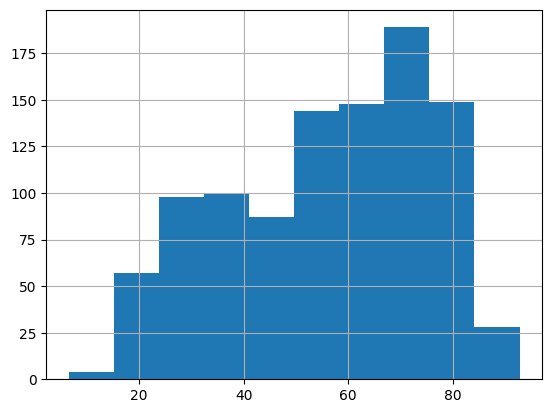

In [11]:
df.happy.hist()

In [12]:
# 1) Build targets (examples)
from deixis.dist.y_distributions import Uniform1D, EmpiricalECDF1D, EmpiricalKDE1D
# e.g., uniform for 'age', empirical for 'trust'
age_target = Uniform1D(27.0, 76.0)
# m,sd = df.attractive.mean(), df.attractive.std()

target2 = Uniform1D(df.white.min(), df.white.max())
target3 = Uniform1D(df.happy.min(), df.happy.max())
target4 = EmpiricalECDF1D([m+np.random.randn()*1 for glist in [df.gender]*5 for m in glist if abs(m-50)>2.5])  # placeholder data

# 2) Regressors and names
names = ['age', 'white', 'happy', 'gender']
regs = [ALL_MODELS[dim] for dim in names]

# 3) Visualizer
viz = AsyncConstantDistVisualizer(G=G, device=device, z_dim=G.mapping.z_dim, sample_size=8)

# 4) Trainer
trainer = IndependentDistributionTrainerACG(
    G=G,
    regressors=regs,
    targets=[age_target, target2, target3, target4],
    device=device,
    names=names,
    k_householder=4,
    r_z=1.0,
    regressor_scales=[100.0, 100.0, 100.0, 100.0],   # per-regressor scaling (if models output 0..1)
    target_weights=np.array([1.0, .1, .1, 1.])/4,         # optional, defaults to uniform
    loss_mix=0.6,
    anisotropy_reg=1e-3,
    orth_iso_reg=1e-3,
    lr=3e-3,
    weight_decay=0.33,
    visualizer=viz,
    cov_ref_size=4096, cov_eval_size=4096, cov_chunk=512
)

trainer.train(
    steps=2000,
    batch_size=512,
    viz_every_params=50,   # ellipse + curves + metrics
    viz_every_faces=250,    # image grid + CPU W-cov divergence
    diag_every=100          # gradient-norm balance checks
)

# Sample with the learned independent-marginals sampler
z_const = trainer.sample_z(4096)

FigureWidget({
    'data': [{'fill': 'toself',
              'fillcolor': 'rgba(0,191,255,0.3)',
              'line': {'color': 'rgba(0,0,0,0)'},
              'name': '2σ Covariance',
              'type': 'scatter',
              'uid': 'fd33209c-5df6-4c81-93e2-fa41a00835c7',
              'x': [],
              'xaxis': 'x',
              'y': [],
              'yaxis': 'y'},
             {'type': 'image', 'uid': '1b72d80a-4596-48f0-bbf7-44c792802cce', 'xaxis': 'x2', 'yaxis': 'y2'},
             {'line': {'width': 2},
              'mode': 'lines+markers',
              'name': 'W2 Loss (avg)',
              'type': 'scatter',
              'uid': 'b131cd44-2000-4b69-a4ce-dd8092f869ad',
              'xaxis': 'x3',
              'yaxis': 'y3'},
             {'line': {'dash': 'dash', 'width': 2},
              'mode': 'lines+markers',
              'name': 'CVM Loss (avg)',
              'type': 'scatter',
              'uid': '96e0cc19-88e3-471b-b306-3c518f79446d',
              'x

/opt/anaconda3/envs/manip311/lib/python3.11/site-packages/jupyter_client/session.py:721: UserWarning:

Message serialization failed with:
Out of range float values are not JSON compliant
Supporting this message is deprecated in jupyter-client 7, please make sure your message is JSON-compliant



[diag @ 100] gW2=2.257e+02  gCVM=4.823e-02  gAniso=1.096e-05  gIso=4.326e-13  :: W2 dominates; lower loss_mix or emphasize CVM.
[diag @ 200] gW2=2.124e+02  gCVM=5.019e-02  gAniso=2.115e-05  gIso=2.059e-12  :: W2 dominates; lower loss_mix or emphasize CVM.
[diag @ 300] gW2=1.238e+02  gCVM=3.695e-02  gAniso=2.620e-05  gIso=9.913e-12  :: W2 dominates; lower loss_mix or emphasize CVM.
[diag @ 400] gW2=1.012e+02  gCVM=1.453e-02  gAniso=2.607e-05  gIso=3.812e-11  :: W2 dominates; lower loss_mix or emphasize CVM.
[diag @ 500] gW2=3.781e+01  gCVM=3.741e-03  gAniso=2.489e-05  gIso=6.890e-11  :: W2 dominates; lower loss_mix or emphasize CVM.
[diag @ 600] gW2=9.804e+01  gCVM=1.028e-02  gAniso=2.368e-05  gIso=8.153e-11  :: W2 dominates; lower loss_mix or emphasize CVM.
[diag @ 700] gW2=6.890e+01  gCVM=3.512e-03  gAniso=2.261e-05  gIso=8.795e-11  :: W2 dominates; lower loss_mix or emphasize CVM.
[diag @ 800] gW2=2.453e+01  gCVM=6.258e-03  gAniso=2.184e-05  gIso=9.537e-11  :: W2 dominates; lower los

In [ ]:
def _sample_z(self, n: int) -> Tuple[torch.Tensor, torch.Tensor]:
    s = torch.randn(n, self.z_dim, device=self.device)
    B = self.Bnet()
    u = s @ B.T
    x = u / (u.norm(dim=1, keepdim=True) + 1e-8)
    z = self.r_z * x
    return z, u

def _forward_batch(self, n: int) -> Dict[str, torch.Tensor]:
    z, u = self._sample_z(n)
    ws = self.G.mapping(z, None)
    w = ws[:, 0]
    t = (self.regressor(w).view(-1) * self.regressor_scale)
    return {"z": z, "u": u, "x": z / (self.r_z + 1e-8), "t": t, "w": w}

torch.save(trainer.Bnet.state_dict(), "all_age_white_bnet2.pt")

In [ ]:
def visualize_acg_on_sphere(
    Bnet: torch.nn.Module,
    *,
    dims3=(0,1,2),
    view_vec=(0.7, 0.4, 1.0),
    mode="2d",                 # "2d" (fast disk) or "3d" (surface)
    N=420,
    res3d=140,
    colorscale="RdBu",
    percentile_clip=97.5,
    shade_strength=0.35,
    n_isolines=10,
    title="ACG density (visible hemisphere)",
    full_sphere=True           # <-- NEW: color entire sphere in 3D
) -> go.Figure:
    G, d = _projected_metric_3x3(Bnet, dims3=dims3)
    R = _camera_frame(view_vec)
    G_cam = R.T @ G @ R


    if mode == "2d":
        # --- disk grid (orthographic) ---
        X, Y, Z, mask = _orthographic_disk_grid(N)
        # quadratic form q^T G q (vectorized)
        g = G_cam
        quad = (
            g[0,0]*X*X + g[1,1]*Y*Y + g[2,2]*Z*Z
            + 2*g[0,1]*X*Y + 2*g[0,2]*X*Z + 2*g[1,2]*Y*Z
        )
        quad = np.clip(quad, 1e-12, None)
        logdens = -(d/2.0) * np.log(quad)

        # center + clip color range on the visible part
        vals = logdens[mask]
        cmid = np.median(vals) if vals.size else np.median(logdens)
        centered = logdens - cmid
        spread = np.percentile(np.abs(centered[mask]), percentile_clip) if vals.size else np.percentile(np.abs(centered), percentile_clip)
        spread = float(spread if spread > 0 else np.max(np.abs(centered)) + 1e-6)

        # inexpensive Lambert shading with light at the camera (L=(0,0,1))
        lambert = Z  # dot(n,L) in camera coords
        shade = (0.35 + 0.65*np.clip(lambert, 0, 1))
        C = centered.copy()
        C[mask] = (1.0 - shade_strength)*C[mask] + shade_strength*(C[mask]*shade[mask])
        C[~mask] = np.nan

        # heatmap + contour lines + circle outline
        fig = go.Figure()
        fig.add_trace(go.Heatmap(
            z=C, x=np.linspace(-1,1,N), y=np.linspace(-1,1,N),
            zmin=-spread, zmax=spread, zmid=0.0,
            colorscale=colorscale, showscale=True, hoverinfo="skip"
        ))
        fig.add_trace(go.Contour(
            z=centered, x=np.linspace(-1,1,N), y=np.linspace(-1,1,N),
            contours=dict(start=-spread, end=spread, size=(2*spread/max(n_isolines,1))),
            line=dict(width=1, color="rgba(0,0,0,0.6)"), showscale=False,
            hoverinfo="skip", connectgaps=False
        ))
        t = np.linspace(0, 2*np.pi, 512)
        fig.add_trace(go.Scatter(
            x=np.cos(t), y=np.sin(t), mode="lines",
            line=dict(width=2, color="black"), showlegend=False, hoverinfo="skip"
        ))
        fig.update_yaxes(scaleanchor="x", scaleratio=1, visible=False)
        fig.update_xaxes(visible=False)
        fig.update_layout(
            title=title + " (2D orthographic)",
            margin=dict(l=0,r=0,t=40,b=0)
        )
        return fig

    # ----------------- 3D branch -----------------
    n_th = int(res3d); n_ph = int(2*res3d)
    eps = 1e-4
    th = np.linspace(eps, np.pi-eps, n_th)
    ph = np.linspace(0, 2*np.pi, n_ph)
    TH, PH = np.meshgrid(th, ph, indexing="ij")
    X = np.sin(TH)*np.cos(PH); Y = np.sin(TH)*np.sin(PH); Z = np.cos(TH)

    g = G_cam
    quad = (
        g[0,0]*X*X + g[1,1]*Y*Y + g[2,2]*Z*Z
        + 2*g[0,1]*X*Y + 2*g[0,2]*X*Z + 2*g[1,2]*Y*Z
    )
    quad = np.clip(quad, 1e-12, None)
    logdens = -(d/2.0) * np.log(quad)

    # center & clip using ALL points if full_sphere else only the front hemi
    if full_sphere:
        cmid = np.median(logdens)
        centered = logdens - cmid
        spread = np.percentile(np.abs(centered), percentile_clip)
    else:
        vis = (Z > 0)  # front hemi in camera coordinates
        cmid = np.median(logdens[vis]) if np.any(vis) else np.median(logdens)
        centered = logdens - cmid
        spread = np.percentile(np.abs(centered[vis]), percentile_clip) if np.any(vis) else np.percentile(np.abs(centered), percentile_clip)
    spread = float(spread if spread > 0 else np.max(np.abs(centered)) + 1e-6)

    # one surface: everything colored
    C = centered
    surf = go.Surface(
        x=X, y=Y, z=Z,
        surfacecolor=C,
        cmin=-spread, cmax=spread, colorscale=colorscale, showscale=True,
        opacity=1.0,
        lighting=dict(ambient=0.45, diffuse=0.6, specular=0.2, roughness=0.9, fresnel=0.1),
        lightposition=dict(x=1.0, y=0.8, z=1.5)
    )

    fig = go.Figure([surf])
    fig.update_layout(
        title=title + (" (3D full sphere)" if full_sphere else " (3D front hemi)"),
        scene=dict(
            aspectmode="data",
            xaxis=dict(visible=False), yaxis=dict(visible=False), zaxis=dict(visible=False),
            camera=dict(eye=dict(x=1.3, y=1.1, z=1.2))
        ),
        margin=dict(l=0,r=0,t=40,b=0)
    )
    return fig
    
import numpy as np
import torch
import plotly.graph_objects as go

# ----- math helpers ---------------------------------------------------------

def _G_and_mperp_from_Bnet(Bnet, dims3=(0,1,2)):
    """
    Use full B=Q S to build:
      G = (Q^T P)^T S^{-2} (Q^T P)   (3x3)
      m_perp = average of Σ^{-1} over U^⊥  (scalar)
    """
    with torch.no_grad():
        Q = Bnet._householder_Q()    # [d,d], orthogonal
        log_sigma = Bnet.log_sigma - Bnet.log_sigma.mean()
        s_inv2 = torch.exp(-2.0 * log_sigma)           # diag of S^{-2}
        d = int(Q.shape[0])

        # columns of Q corresponding to dims3, then transpose -> U: (d,3)
        U = Q.t()[:, list(dims3)]
        # 3x3 metric on the view subspace
        G = (U.t() * s_inv2).mm(U).detach().cpu().numpy().astype(np.float64)

        # trace of Σ^{-1} = tr(S^{-2}) (orthogonal invariance)
        trace_M = float(s_inv2.sum().cpu().item())
        trG = float(np.trace(G))
        denom = max(d - 3, 1)  # avoid /0 when d=3
        m_perp = (trace_M - trG) / denom

    return G, m_perp, d

def _camera_R(view_vec):
    v = np.asarray(view_vec, dtype=np.float64)
    v /= (np.linalg.norm(v)+1e-12)
    ref = np.array([0.0,0.0,1.0]) if abs(v[2]) < 0.9 else np.array([1.0,0.0,0.0])
    e1 = np.cross(v, ref); e1 /= (np.linalg.norm(e1)+1e-12)
    e2 = np.cross(v, e1);  e2 /= (np.linalg.norm(e2)+1e-12)
    e3 = v
    return np.stack([e1,e2,e3], axis=1)  # columns are camera axes in world

def _build_F_of_c(G_cam, m_perp, d, n_c=256, n_quad=64):
    """
    Precompute LUT F(c) ~ projected density (log of it) on c ∈ [λ_min, λ_max]
    using Gauss–Legendre on α∈[0,1].
    """
    lam = np.linalg.eigvalsh(G_cam)
    cmin, cmax = float(lam.min()), float(lam.max())
    cgrid = np.linspace(cmin, cmax, n_c)

    # Gauss–Legendre on [0,1]
    xi, wi = np.polynomial.legendre.leggauss(n_quad)  # nodes in [-1,1]
    alpha = 0.5*(xi + 1.0)
    w = 0.5*wi
    weight = (1.0 - alpha**2)**((d-4)/2.0)  # fiber multiplicity

    # Broadcast over cgrid
    a2 = alpha[:, None]**2
    term = lambda c: (a2 * c[None, :] + (1.0 - a2) * m_perp)**(-d/2.0)
    integrand = weight[:, None] * term(cgrid)
    phi = np.maximum(np.sum(w[:, None] * integrand, axis=0), 1e-300)  # avoid log(0)

    # Return log-density + handy linear interp function
    logF = np.log(phi)
    def lookup(c):
        # clamp and linear interpolate
        c_clamped = np.clip(c, cmin, cmax)
        t = (c_clamped - cmin) / max(cmax - cmin, 1e-12)
        idx = t * (n_c - 1)
        i0 = np.floor(idx).astype(int)
        i1 = np.minimum(i0 + 1, n_c - 1)
        frac = idx - i0
        return (1.0 - frac) * logF[i0] + frac * logF[i1]
    return lookup, (cmin, cmax)

# ----- visualization --------------------------------------------------------

def visualize_acg_pushforward(
    Bnet: torch.nn.Module,
    *,
    dims3=(0,1,2),
    view_vec=(0.7,0.4,1.0),
    mode="3d",           # "3d" full sphere (fast) or "2d" disk
    N=420,               # 2D grid
    res3d=160,           # 3D theta (phi=2*theta)
    colorscale="RdBu",
    percentile_clip=97.5,
    title="Projected (pushforward) ACG density from S^{d-1} → S^2"
) -> go.Figure:
    """
    Fast pushforward visualization that *projects the full n-sphere density*
    onto a viewing sphere. Uses a 1-D quadrature LUT in c(u)=u^T G u.
    """
    # 1) full-B compression + camera
    G, m_perp, d = _G_and_mperp_from_Bnet(Bnet, dims3=dims3)
    R = _camera_R(view_vec)
    G_cam = R.T @ G @ R

    # 2) precompute log F(c)
    F_lookup, _ = _build_F_of_c(G_cam, m_perp, d, n_c=256, n_quad=64)

    if mode == "2d":
        # Disk grid (orthographic)
        xs = np.linspace(-1, 1, N)
        ys = np.linspace(-1, 1, N)
        X, Y = np.meshgrid(xs, ys, indexing="xy")
        R2 = X*X + Y*Y
        mask = R2 <= 1.0
        Z = np.zeros_like(X); Z[mask] = np.sqrt(1.0 - R2[mask])

        # c(u) on camera sphere
        g = G_cam
        c = g[0,0]*X*X + g[1,1]*Y*Y + g[2,2]*Z*Z + 2*g[0,1]*X*Y + 2*g[0,2]*X*Z + 2*g[1,2]*Y*Z

        logphi = np.full_like(X, np.nan, dtype=np.float64)
        logphi[mask] = F_lookup(c[mask])

        # center + clip
        vals = logphi[mask]
        cmid = np.median(vals)
        C = logphi - cmid
        spread = np.percentile(np.abs(C[mask]), percentile_clip)
        spread = float(spread if spread > 0 else np.max(np.abs(C[mask])) + 1e-6)

        t = np.linspace(0, 2*np.pi, 512)
        fig = go.Figure()
        fig.add_trace(go.Heatmap(
            z=C, x=xs, y=ys, zmin=-spread, zmax=spread, zmid=0.0,
            colorscale=colorscale, hoverinfo="skip", showscale=True
        ))
        fig.add_trace(go.Scatter(x=np.cos(t), y=np.sin(t), mode="lines",
                                 line=dict(width=2, color="black"), showlegend=False))
        fig.update_yaxes(scaleanchor="x", scaleratio=1, visible=False)
        fig.update_xaxes(visible=False)
        fig.update_layout(title=title+" (2D orthographic pushforward)",
                          margin=dict(l=0,r=0,t=40,b=0))
        return fig

    # ---------- 3D full-sphere ----------
    n_th = int(res3d); n_ph = int(2*res3d)
    eps = 1e-4
    th = np.linspace(eps, np.pi-eps, n_th)
    ph = np.linspace(0, 2*np.pi, n_ph)
    TH, PH = np.meshgrid(th, ph, indexing="ij")
    X = np.sin(TH)*np.cos(PH); Y = np.sin(TH)*np.sin(PH); Z = np.cos(TH)

    g = G_cam
    c = (g[0,0]*X*X + g[1,1]*Y*Y + g[2,2]*Z*Z
         + 2*g[0,1]*X*Y + 2*g[0,2]*X*Z + 2*g[1,2]*Y*Z)

    logphi = F_lookup(c)
    cmid = np.median(logphi)
    C = logphi - cmid
    spread = np.percentile(np.abs(C), percentile_clip)
    spread = float(spread if spread > 0 else np.max(np.abs(C)) + 1e-6)

    fig = go.Figure([go.Surface(
        x=X, y=Y, z=Z, surfacecolor=C,
        cmin=-spread, cmax=spread, colorscale=colorscale, showscale=True,
        lighting=dict(ambient=0.45, diffuse=0.65, specular=0.2, roughness=0.9),
        lightposition=dict(x=1.0, y=0.8, z=1.6)
    )])
    fig.update_layout(
        title=title+" (3D pushforward, full sphere)",
        scene=dict(
            aspectmode="data",
            xaxis=dict(visible=False), yaxis=dict(visible=False), zaxis=dict(visible=False),
            camera=dict(eye=dict(x=1.25,y=1.1,z=1.2))
        ),
        margin=dict(l=0,r=0,t=40,b=0)
    )
    return fig

# If you still want a rotatable 3-D
fig3d = visualize_acg_pushforward(trainer.Bnet, mode="3d", res3d=120)
fig3d.show()

KeyboardInterrupt: 

(array([1.50000e+01, 9.70000e+01, 3.17000e+02, 6.87000e+02, 2.59477e+05,
        6.20000e+02, 3.07000e+02, 8.80000e+01, 2.20000e+01, 2.00000e+00]),
 array([-1.15060437, -0.89455068, -0.63849699, -0.38244328, -0.12638958,
         0.12966412,  0.38571781,  0.6417715 ,  0.89782524,  1.15387893,
         1.40993261]),
 <BarContainer object of 10 artists>)

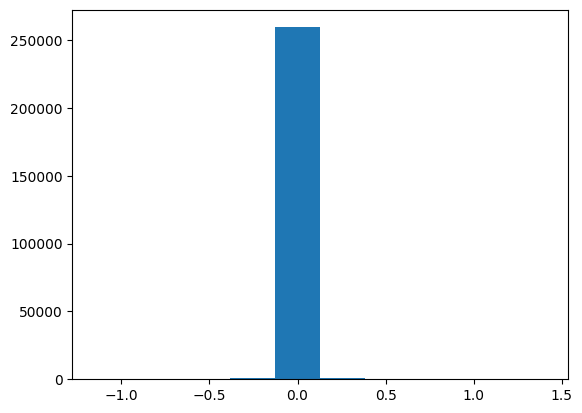

In [ ]:
B = trainer.Bnet().detach().cpu()
B_diag = torch.diag(B)
B_offdiag = B[~torch.eye(B.shape[0], dtype=bool)]
# plt.plot(B_diag)
plt.hist(B_offdiag)

In [ ]:
import numpy as np
import torch
import plotly.graph_objects as go

# --- helpers -------------------------------------------------

def _camera_frame(view_vec):
    v = np.asarray(view_vec, dtype=np.float64)
    v /= (np.linalg.norm(v) + 1e-12)
    ref = np.array([0.0,0.0,1.0]) if abs(v[2]) < 0.9 else np.array([1.0,0.0,0.0])
    e1 = np.cross(v, ref); e1 /= (np.linalg.norm(e1)+1e-12)
    e2 = np.cross(v, e1);  e2 /= (np.linalg.norm(e2)+1e-12)
    e3 = v
    R = np.stack([e1,e2,e3], axis=1)  # camera->world
    return R

def _orthographic_disk_grid(N):
    xs = np.linspace(-1.0, 1.0, N)
    ys = np.linspace(-1.0, 1.0, N)
    X, Y = np.meshgrid(xs, ys, indexing="xy")
    R2 = X*X + Y*Y
    mask = (R2 <= 1.0)
    Z = np.zeros_like(X); Z[mask] = np.sqrt(np.maximum(0.0, 1.0 - R2[mask]))
    return X, Y, Z, mask

# --- main ----------------------------------------------------

def visualize_acg_projection_fullB(
    Bnet: torch.nn.Module,
    *,
    dims3=(0,1,2),               # which 3 latent axes you want to visualize
    view_vec=(0.8, 0.3, 1.0),    # where the camera looks; affects shading/orientation
    mode="3d",                   # "3d" (surface) or "2d" (fast disk)
    res3d=160,                   # theta resolution for the 3D sphere (phi=2*res3d)
    N2d=420,                     # grid for the 2D disk
    kappa=32.0,                  # vMF concentration (larger = sharper blobs)
    amp_power=1.5,               # how strongly to down/up-weight rows by ||Q[i, :3]||
    colorscale="RdBu",
    percentile_clip=98.0,
    add_isolines=True,
    title="Full-B projection of ACG anisotropy"
) -> go.Figure:
    """
    Projects the *full* ACG density anisotropy (from B = Q S) to a 3-D sphere by:
      - scoring every canonical axis e_i via log-density at e_i,
      - mapping each e_i to a 3-D direction using the i-th row of Q on the chosen 3 columns,
      - kernel-smoothing these samples on S^2.

    Returns a Plotly figure (3-D surface or 2-D disk).
    """
    with torch.no_grad():
        # Get Q and S^{-2} without forming any dxd inverses
        Q = Bnet._householder_Q()                        # [d,d] orthogonal
        log_sigma = Bnet.log_sigma - Bnet.log_sigma.mean()
        s_inv_sq = torch.exp(-2.0 * log_sigma)           # diag entries of S^{-2}
        Qcpu = Q.detach().cpu()
        s_inv_sq_cpu = s_inv_sq.detach().cpu()

    d = Qcpu.shape[0]
    cols = list(dims3)

    # --- 1) full-B scores for each canonical axis e_i
    # Σ^{-1} = Q diag(s_inv_sq) Q^T  =>  (Σ^{-1})_{ii} = sum_k s_inv_sq_k * Q_{ik}^2
    # log-density at e_i (up to const):  ℓ_i = -(d/2) * log( (Σ^{-1})_{ii} )
    q2 = (Qcpu**2)                                  # [d,d]
    quad_diag = torch.mv(q2, s_inv_sq_cpu) + 1e-12  # [d]
    logdens_i = -(d/2.0) * torch.log(quad_diag)     # [d]
    vals = logdens_i.numpy()

    # center and scale for diverging color
    cmid = np.median(vals)
    v_center = vals - cmid

    # --- 2) map each e_i to a 3-D direction using the row of Q on chosen columns
    # world-space 3D "anchors"
    P_world = Qcpu[:, cols].numpy()                 # [d,3]; row i is direction proxy for e_i
    norms = np.linalg.norm(P_world, axis=1)
    good = norms > 1e-8
    U_world = np.zeros_like(P_world)
    U_world[good] = (P_world[good] / norms[good, None])

    # weight samples by how much of that row lives in these 3 columns
    amp = norms**amp_power                          # [d], in [0,1]^amp_power

    # rotate those anchors into camera coords so front is +z
    R = _camera_frame(view_vec)                     # camera->world
    U_cam = (R.T @ U_world.T).T                    # [d,3] camera coords

    # Keep anchors that actually exist in the chosen 3D subspace
    keep = good
    U = U_cam[keep]                                 # (m,3)
    s = v_center[keep]                              # (m,)
    a = amp[keep]                                   # (m,)
    m = U.shape[0]
    if m == 0:
        raise RuntimeError("No rows of Q project onto the chosen 3 dims (check dims3).")

    # --- 3) paint the sphere by vMF kernel smoothing of those m samples on S^2
    def _smooth_on_sphere(X, Y, Z, mask):
        pts = np.stack([X[mask], Y[mask], Z[mask]], axis=1)    # (N,3)
        # dots = pts @ U.T  -> (N,m)
        dots = pts @ U.T
        W = np.exp(kappa * np.clip(dots, -1, 1))               # vMF weights
        W *= a[None, :]                                        # amplitude weighting
        num = W @ s                                            # (N,)
        den = W.sum(axis=1) + 1e-12
        f = num / den                                          # smoothed value on visible points

        # Place back into full grid
        out = np.empty_like(X); out[:] = np.nan
        out[mask] = f
        return out

    # --- 3D surface ------------------------------------------
    if mode == "3d":
        n_th = int(res3d); n_ph = int(2*res3d)
        eps = 1e-4
        th = np.linspace(eps, np.pi-eps, n_th)
        ph = np.linspace(0, 2*np.pi, n_ph)
        TH, PH = np.meshgrid(th, ph, indexing="ij")
        X = np.sin(TH)*np.cos(PH); Y = np.sin(TH)*np.sin(PH); Z = np.cos(TH)

        # Smooth over *all* directions on S^2 (no masking)
        mask_all = np.ones_like(X, dtype=bool)
        FIELD = _smooth_on_sphere(X, Y, Z, mask_all)

        spread = np.percentile(np.abs(FIELD[np.isfinite(FIELD)]), percentile_clip)
        spread = float(spread if spread > 0 else np.nanmax(np.abs(FIELD)) + 1e-6)

        fig = go.Figure([go.Surface(
            x=X, y=Y, z=Z,
            surfacecolor=FIELD,
            cmin=-spread, cmax=spread, 
            colorscale=colorscale, showscale=True,
            lighting=dict(ambient=0.45, diffuse=0.6, specular=0.2, roughness=0.9),
            lightposition=dict(x=1.0, y=0.8, z=1.8)
        )])

        # show the m anchor directions as tiny points (optional but useful)
        fig.add_trace(go.Scatter3d(
            x=U[:,0], y=U[:,1], z=U[:,2],
            mode="markers",
            marker=dict(size=2, color="black", opacity=0.6),
            showlegend=False
        ))

        fig.update_layout(
            title=title + " — 3D full-B projection",
            scene=dict(
                aspectmode="data",
                xaxis=dict(visible=False), yaxis=dict(visible=False), zaxis=dict(visible=False),
                camera=dict(eye=dict(x=1.3, y=1.1, z=1.2))
            ),
            margin=dict(l=0, r=0, t=42, b=0)
        )
        return fig

    # --- 2D disk (visible hemisphere) -------------------------
    X, Y, Z, mask = _orthographic_disk_grid(N2d)
    FIELD = _smooth_on_sphere(X, Y, Z, mask)

    spread = np.percentile(np.abs(FIELD[mask]), percentile_clip)
    spread = float(spread if spread > 0 else np.nanmax(np.abs(FIELD)) + 1e-6)

    fig = go.Figure()
    fig.add_trace(go.Heatmap(
        z=FIELD, x=np.linspace(-1,1,N2d), y=np.linspace(-1,1,N2d),
        zmin=-spread, zmax=spread, zmid=0.0, colorscale=colorscale, hoverinfo="skip"
    ))
    if add_isolines:
        step = (2*spread)/12
        fig.add_trace(go.Contour(
            z=FIELD, x=np.linspace(-1,1,N2d), y=np.linspace(-1,1,N2d),
            contours=dict(start=-spread, end=spread, size=step),
            line=dict(width=1, color="rgba(0,0,0,0.55)"), showscale=False, hoverinfo="skip", connectgaps=False
        ))
    t = np.linspace(0, 2*np.pi, 512)
    fig.add_trace(go.Scatter(x=np.cos(t), y=np.sin(t), mode="lines",
                             line=dict(width=2, color="black"), showlegend=False, hoverinfo="skip"))
    fig.update_yaxes(scaleanchor="x", scaleratio=1, visible=False)
    fig.update_xaxes(visible=False)
    fig.update_layout(title=title + " — 2D disk (full-B projection)",
                      margin=dict(l=0, r=0, t=42, b=0))
    return fig




fig = visualize_acg_projection_fullB(trainer.Bnet, mode="3d", res3d=120)
fig.show()

In [ ]:
# 3-D, full sphere
# fig = visualize_acg_projection_fullB(trainer.Bnet, mode="3d",
#                                      dims3=(0,1,2), view_vec=(0.8,0.2,1.0),
#                                      res3d=160, kappa=28.0)
# fig.show()

# 2-D disk (fast panel for the trainer UI)
fig2 = visualize_acg_projection_fullB(trainer.Bnet, mode="2d",
                                      N2d=420, kappa=44.0)
fig2.show()

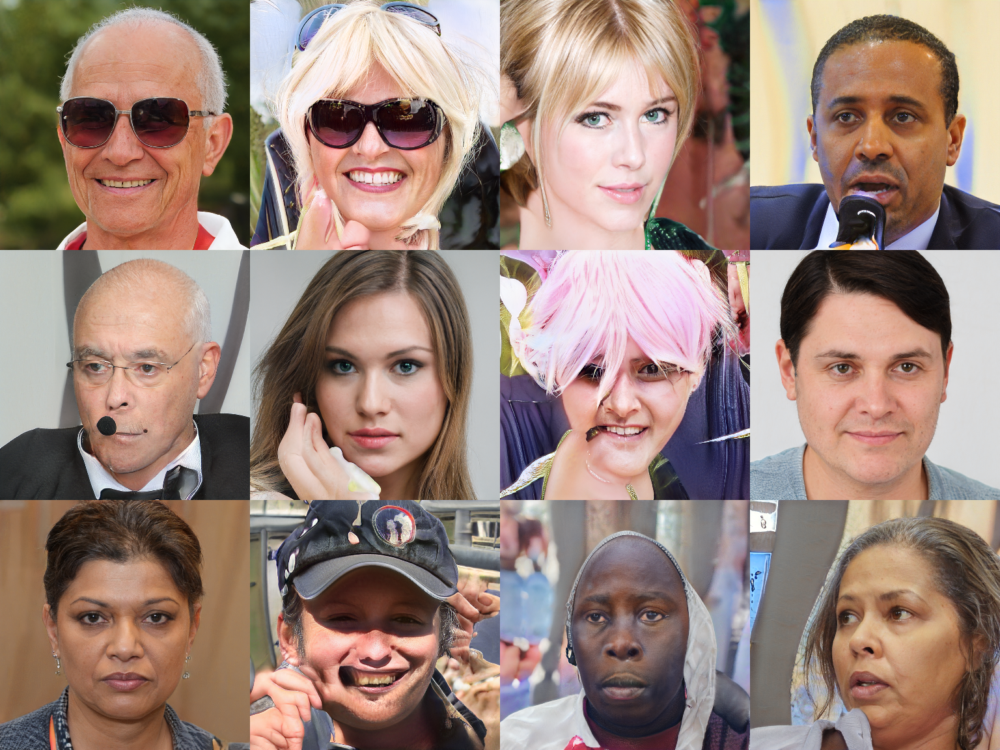

In [ ]:
import math
from typing import Optional, Tuple, List
from IPython.display import display

def _make_grid_pil(imgs: List[Image.Image], rows: int = 4) -> Image.Image:
    """Assemble a list of equally-sized PIL images into a grid."""
    if not imgs:
        raise ValueError("No images to grid.")
    w, h = imgs[0].size
    rows = max(1, rows)
    cols = math.ceil(len(imgs) / rows)
    canvas = Image.new("RGB", (cols * w, rows * h))
    for i, im in enumerate(imgs):
        if im.size != (w, h):
            im = im.resize((w, h), resample=Image.BILINEAR)
        canvas.paste(im, ( (i % cols) * w, (i // cols) * h ))
    return canvas

@torch.no_grad()
def sample_and_show_faces(
    trainer: ConstantDistributionTrainerACG,
    n: int = 16,
    rows: int = 4,
    out_size: int = 384,
    normalize_z: bool = True,
    seed: Optional[int] = None,
    save_path: Optional[str] = None,
) -> Tuple[Image.Image, List[Image.Image]]:
    """
    Sample n latents from a *trained* ConstantDistributionTrainerACG and show generated faces.

    Args:
        trainer: Trained ConstantDistributionTrainerACG instance.
        n: Number of samples to generate.
        rows: How many rows in the display grid.
        out_size: Resize each image to this square resolution for display.
        normalize_z: If True, feed unit-norm z to G.mapping (matches your visualizer).
        seed: Optional RNG seed for reproducibility.
        save_path: Optional path to save the grid image (e.g., 'faces_grid.png').

    Returns:
        (grid_image, pil_images): The grid PIL image and the list of individual PIL images.
    """
    if seed is not None:
        torch.manual_seed(seed)
        np.random.seed(seed)

    G = trainer.G.eval()

    # 1) Sample z from the trainer
    z = trainer.sample_z(n*2)[n:]  # shape [n, z_dim]
    if normalize_z:
        z = z / (z.norm(dim=-1, keepdim=True) + 1e-8)

    # 2) Map to W and synthesize
    ws = G.mapping(z, None, truncation_psi=0.7)            # [n, num_layers, w_dim]
    imgs_tensor = G.synthesis(ws)      # expected in [-1, 1], shape [n, C, H, W]

    # 3) Convert to PILs and make a grid
    pil_images = tensor_to_pil_batch(imgs_tensor, out_size=out_size)
    grid = _make_grid_pil(pil_images, rows=rows)

    # 4) Display (and optionally save)
    display(grid)
    if save_path is not None:
        grid.save(save_path)

    return grid, pil_images

# Example usage:
grid, faces = sample_and_show_faces(trainer, n=12, rows=3, out_size=384, seed=42)

In [ ]:
df

,Unnamed: 0,stimulus,trustworthy,attractive,dominant,smart,age,gender,weight,typical,...,native,black,white,looks-like-you,gay,electable,godly,outdoors,dlatents,loss
0,0,1,43.673077,46.552632,79.771429,55.405405,50.404255,86.891892,38.119048,66.736842,...,13.925926,5.105263,92.970588,31.428571,20.523810,61.486486,53.439024,83.925000,"[-0.34055513, -1.9114306, -0.2459186, 0.119695...",0.170817
1,1,2,65.000000,59.750000,48.666667,57.891892,31.300000,12.560976,48.275000,49.209302,...,54.564516,72.735294,4.880952,13.465116,31.414634,66.184211,62.809524,57.513514,"[-0.77707213, -1.450018, 0.03675404, 0.2841083...",0.166311
2,2,3,37.010526,36.000000,65.428571,65.057143,51.745098,74.789474,44.790698,48.666667,...,33.898305,3.972222,68.787879,18.363636,46.024390,70.804878,55.921053,11.292683,"[-0.5631943, -0.4127729, 2.1988897, 0.5081659,...",0.142555
3,3,4,64.053191,65.500000,47.194444,54.700000,24.777778,9.526316,32.375000,44.024390,...,49.824561,72.552632,3.315789,10.500000,20.365854,57.179487,62.051282,16.560976,"[-0.9139883, 1.6725628, 0.964052, 1.1866649, -...",0.194268
4,4,5,69.577320,50.702703,56.257143,61.527778,44.534884,14.650000,40.250000,70.184211,...,10.910714,3.702703,88.842105,19.000000,21.783784,70.888889,71.833333,20.777778,"[-1.2948744, -1.5081217, -1.0790169, -0.883098...",0.183126
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
999,999,1000,51.678161,45.970588,59.171429,51.925000,40.142857,86.257143,53.235294,73.714286,...,19.256410,6.647059,81.857143,26.371429,29.055556,57.975000,60.757576,14.923077,"[-0.14424458, 0.5183627, -0.17587073, 0.384992...",0.211044
1000,1000,1001,76.918605,66.928571,37.105263,53.864865,16.294118,11.200000,44.138889,57.228571,...,45.717949,10.289474,58.500000,23.085714,18.783784,27.243902,68.800000,87.636364,"[0.66468793, -0.426184, 1.5559996, -0.3777003,...",0.132792
1001,1001,1002,50.318182,44.902439,63.578947,64.736842,37.969697,82.297297,51.333333,52.891892,...,60.200000,18.500000,13.351351,16.515152,24.378378,63.871795,49.900000,12.914286,"[-0.2239002, 0.0008723813, 0.67230093, -0.1520...",0.108586
1002,1002,1003,55.551724,69.842105,54.625000,48.250000,26.029412,8.307692,41.358974,54.085714,...,44.375000,11.685714,47.027027,22.230769,25.400000,56.852941,63.435897,17.714286,"[0.16991338, 0.4349591, 0.07480586, -0.3928165...",0.133602


In [ ]:
# ================================================
# Rotation-plane fitter for a scalar regressor f(w)
# Uses Householder reflections to parameterize Q∈O(d)
# and learns a 2D plane where f ≈ g(θ), θ=atan2(b,a).
# ================================================
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch import autograd
from tqdm import tqdm

# -------- Householder machinery (fast, no full Q build during training) --------
def _normalize(v, eps=1e-8):
    return v / (v.norm(dim=-1, keepdim=True) + eps)

def apply_reflections_right(Z: torch.Tensor, vs: torch.Tensor) -> torch.Tensor:
    """
    Apply H1,...,Hk on the right to a batch of row-vectors Z: Z @ H1 @ ... @ Hk
    Each H(v) = I - 2 v v^T with v normalized.
    Args:
        Z: [N, d] (row vectors)
        vs: [k, d] Householder vectors (unconstrained)
    Returns:
        Z': [N, d]
    """
    for v in vs:
        v = _normalize(v)
        Zv = Z @ v  # [N]
        Z = Z - 2.0 * torch.outer(Zv, v)  # [N,d] - [N,1]*[1,d]
    return Z

def materialize_Q(vs: torch.Tensor) -> torch.Tensor:
    """
    Build full Q = Hk ... H1 explicitly (for exporting after training).
    """
    d = vs.shape[1]
    Q = torch.eye(d, device=vs.device, dtype=vs.dtype)
    for v in vs:
        v = _normalize(v)
        H = torch.eye(d, device=vs.device, dtype=vs.dtype) - 2.0 * torch.outer(v, v)
        Q = Q @ H  # note: right-multiply builds H1 on the right first, equivalent orientation for our usage
    return Q

# -------- First-harmonic "circular head" with ridge-regularized closed-form fit --------
def first_harmonic_fit(theta: torch.Tensor, y: torch.Tensor, ridge: float = 1e-4):
    """
    Fit y ≈ β0 + βc cosθ + βs sinθ by ridge-regularized least squares.
    Differentiable w.r.t. θ and y (through normal equations).
    Returns: y_hat, (β0, βc, βs)
    """
    c = torch.cos(theta)
    s = torch.sin(theta)
    X = torch.stack([torch.ones_like(theta), c, s], dim=1)  # [N,3]
    # β = (XᵀX + λI)^(-1) Xᵀ y
    XtX = X.transpose(0, 1) @ X              # [3,3]
    XtX = XtX + ridge * torch.eye(3, device=X.device, dtype=X.dtype)
    Xty = X.transpose(0, 1) @ y              # [3]
    # beta = torch.linalg.solve(XtX, Xty)      # [3]
    beta = torch.linalg.pinv(XtX) @ Xty
    y_hat = (X @ beta)                       # [N]
    return y_hat, beta

# -------- The fitter module --------
class RotationPlaneFitter(nn.Module):
    """
    Learn k Householder vectors vs ∈ R^{k×d} so that in rotated coords z' = z @ Q^T,
    the attribute f(w) is (mostly) a function of angle θ = atan2(b, a), where (a,b)=z'[:2].
    """
    def __init__(
        self,
        *,
        G: nn.Module,
        regressor: nn.Module,    # scalar head: w -> y
        d: int,
        device: torch.device,
        k_householder: int = 8,
        lr: float = 5e-3,
        lambda_fit: float = 1.0,     # weight for angle fit loss
        lambda_perp: float = 1e-2,   # penalize sensitivity to z'_perp
        lambda_rad: float = 1e-2,    # penalize sensitivity along plane radius
        regressor_scale: float = 1.0,# multiply regressor output (e.g., 100.0 if your heads output 0..1)
        ridge: float = 1e-4,         # ridge for harmonic fit
        grad_clip: float = 10.0
    ):
        super().__init__()
        self.G = G.eval()
        self.regressor = regressor.eval()
        self.device = device
        self.d = d
        self.vs = nn.Parameter(torch.randn(k_householder, d, device=device) * 0.01)
        self.opt = torch.optim.Adam([self.vs], lr=lr, betas=(0.9, 0.99))
        self.lambda_fit = lambda_fit
        self.lambda_perp = lambda_perp
        self.lambda_rad = lambda_rad
        self.regressor_scale = regressor_scale
        self.ridge = ridge
        self.grad_clip = grad_clip

        # freeze G/heads params (we only optimize vs)
        for p in self.G.parameters(): p.requires_grad_(False)
        for p in self.regressor.parameters(): p.requires_grad_(False)

    @torch.no_grad()
    def export_Q(self) -> torch.Tensor:
        return materialize_Q(self.vs.detach())

    def forward_batch(self, z: torch.Tensor):
        """
        Rotate z to z', compute θ, f(w), and y_hat (first harmonic).
        Returns a dict with everything needed for the losses.
        """
        # rotate: z' = z @ Q^T == apply reflections on the RIGHT to rows of z
        z_rot = apply_reflections_right(z, self.vs)     # [N,d]
        a, b = z_rot[:, 0], z_rot[:, 1]
        theta = torch.atan2(b, a)                       # [N], angle in learned plane

        with torch.no_grad():
            ws = self.G.mapping(z, None)
        w = ws[:, 0]                                    # [N, w_dim] (assumes StyleGAN-style)
        y = (self.regressor(w).view(-1) * self.regressor_scale)  # [N]

        # first-harmonic fit y ≈ β0 + βc cos θ + βs sin θ (differentiable wrt θ)
        y_hat, beta = first_harmonic_fit(theta, y, ridge=self.ridge)
        return {
            "z": z, "z_rot": z_rot, "theta": theta, "y": y, "y_hat": y_hat, "beta": beta
        }

    def grad_sensitivity_terms(self, z: torch.Tensor):
        """
        Compute gradients of y wrt z, then transform to rotated coords z' to split
        into plane vs complement sensitivities. Penalize:
          - perp sensitivity: ||∂y/∂z'_{2:}||^2
          - radial sensitivity: ((∂y/∂z'_{0:2}) ⋅ r_hat)^2, r_hat = (a,b)/|| (a,b) ||
        """
        z = z.detach().clone().requires_grad_(True)
        with torch.enable_grad():
            ws = self.G.mapping(z, None)
            w = ws[:, 0]
            y = (self.regressor(w).view(-1) * self.regressor_scale)

            # gradient wrt original z
            grad_z = autograd.grad(y.sum(), z, create_graph=False, retain_graph=False)[0]  # [N,d]

        # transform gradient rows to rotated coords: grad_z' = grad_z @ Q^T (same op as z rotation)
        grad_zprime = apply_reflections_right(grad_z, self.vs)  # [N,d]

        # split plane vs complement using the same current rotation of *z* to get a,b
        z_rot = apply_reflections_right(z.detach(), self.vs)
        a, b = z_rot[:, 0], z_rot[:, 1]
        r = torch.sqrt(a*a + b*b) + 1e-8
        r_hat = torch.stack([a/r, b/r], dim=1)                  # [N,2]

        grad_plane = grad_zprime[:, :2]                          # [N,2]
        grad_perp  = grad_zprime[:, 2:]                          # [N,d-2]

        # perp sensitivity
        L_perp = (grad_perp.pow(2).mean())

        # radial component in the plane
        grad_rad = (grad_plane * r_hat).sum(dim=1)               # [N]
        L_rad = (grad_rad.pow(2).mean())

        return L_perp, L_rad

    def train_fit(
        self,
        *,
        steps: int = 2000,
        batch_size: int = 512,
        log_every: int = 50,
        seed: int = 0,
        z_std: float = 1.0
    ):
        torch.manual_seed(seed)
        self.train()

        for step in tqdm(range(1, steps + 1), desc="Fitting rotation plane"):
            z = torch.randn(batch_size, self.d, device=self.device) * z_std

            # angle fit (uses y but no grads through G/heads)
            out = self.forward_batch(z)
            L_fit = F.mse_loss(out["y_hat"], out["y"])

            # sensitivity penalties (need grads through G wrt z only)
            L_perp, L_rad = self.grad_sensitivity_terms(z)
            

            loss = self.lambda_fit * L_fit #+ self.lambda_perp * L_perp + self.lambda_rad * L_rad

            self.opt.zero_grad(set_to_none=True)
            loss.backward()
            nn.utils.clip_grad_norm_([self.vs], max_norm=self.grad_clip)
            self.opt.step()

            if step % log_every == 0:
                with torch.no_grad():
                    # R^2 of first harmonic fit as a quick quality signal
                    y = out["y"]; y_hat = out["y_hat"]
                    r2 = 1.0 - torch.var(y - y_hat) / (torch.var(y) + 1e-12)
                    print(f"[{step:04d}] "
                          f"L_fit={L_fit.item():.4f}  L_perp={L_perp.item():.4e}  L_rad={L_rad.item():.4e}  "
                          f"R2(1st harm)={r2.item():.3f}  beta={out['beta'].tolist()}")

        self.eval()
        print("Done. Use fitter.export_Q() to get the rotation matrix.")

# -------- Helper for editing by angle after fitting --------
@torch.no_grad()
def edit_by_angle(z: torch.Tensor, Q: torch.Tensor, delta: float) -> torch.Tensor:
    """
    Rotate each z in the fitted plane by angle 'delta' (radians), leaving the orthogonal
    complement untouched: z_new = Q^T [ R(δ)·(a,b); z'_perp ], with z' = Q z.
    """
    # go to rotated coords
    z_rot = (z @ Q.T)
    a, b = z_rot[:, 0].clone(), z_rot[:, 1].clone()
    cosd, sind = float(torch.cos(torch.tensor(delta))), float(torch.sin(torch.tensor(delta)))
    a_new =  cosd * a - sind * b
    b_new =  sind * a + cosd * b
    z_rot[:, 0], z_rot[:, 1] = a_new, b_new
    # map back
    return (z_rot @ Q)

# =========================
# Usage example
# =========================
# Assumes you already have:
#   - G: StyleGAN generator with .mapping
#   - ALL_MODELS['age']: a scalar regressor head taking w and returning a scalar
#   - device: torch.device

d = G.mapping.z_dim
age_head = ALL_MODELS['age']  # replace with your chosen key

fitter = RotationPlaneFitter(
    G=G,
    regressor=age_head,
    d=d,
    device=device,
    k_householder=4,       # try 4–8; increase if angle-fit stalls
    lr=5e-3,
    lambda_fit=1.0,
    lambda_perp=1e-2,
    lambda_rad=1e-2,
    regressor_scale=100.0  # set to 1.0 if your head already outputs in target units
).to(device)

# Train the rotation
fitter.train_fit(steps=150, batch_size=2048, log_every=50)

# Export Q and test an edit:
Q = fitter.export_Q()  # [d,d]
z_test = torch.randn(8, d, device=device)
z_edit = edit_by_angle(z_test, Q, delta=0.6)  # rotate by ~34 degrees in learned plane

# (Optional) visualize before/after with your synthesis pipeline:
# imgs_before = G.synthesis(G.mapping(z_test, None))
# imgs_after  = G.synthesis(G.mapping(z_edit, None))

Fitting rotation plane:  35%|███▍      | 52/150 [00:05<00:09,  9.84it/s]

[0050] L_fit=108.0384  L_perp=1.3033e-01  L_rad=1.1930e+01  R2(1st harm)=0.398  beta=[33.23078536987305, -8.157564163208008, 8.78278923034668]


Fitting rotation plane:  68%|██████▊   | 102/150 [00:10<00:04,  9.85it/s]

[0100] L_fit=100.1672  L_perp=1.3630e-01  L_rad=1.4303e+01  R2(1st harm)=0.440  beta=[32.962249755859375, -9.682985305786133, 8.22694206237793]


Fitting rotation plane: 100%|██████████| 150/150 [00:15<00:00,  9.41it/s]

[0150] L_fit=96.7590  L_perp=1.2047e-01  L_rad=1.2714e+01  R2(1st harm)=0.439  beta=[32.867401123046875, -9.432807922363281, 7.688022613525391]
Done. Use fitter.export_Q() to get the rotation matrix.


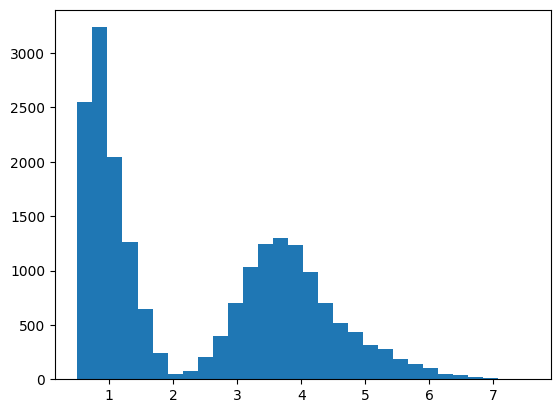

In [ ]:
# important
with torch.no_grad():
    w_sample = G.mapping(trainer._sample_z(10_000)[1], None)
    ages = ALL_MODELS['attractive'](w_sample[:,0]).view(-1)
    # histogram of ages
    plt.hist(ages.cpu().numpy().flatten(), bins=30)
    plt.show()


In [ ]:
from deixis.dist.y_distributions import *



# 1) Empirical ECDF target
dist_ecdf = EmpiricalECDF1D(ages.flatten())

# 2) Smooth target via Gaussian KDE (bandwidth picked automatically)
dist_kde  = EmpiricalKDE1D(ages.flatten())

# Compare a model batch x against the target
# x = your_regressor_outputs  # shape [N]
# loss_w2  = w2_quantile_loss_to_target(x, dist_kde)
# loss_cvm = cvm_loss_to_target(x, dist_kde)

/Users/adamsobieszek/PycharmProjects/_manipy/math_notebooks/y_distributions.py:253: UserWarning:

To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).



In [ ]:
ccc
dist_ecdf = EmpiricalKDE1D(df.gender)
dist_ecdf.hist()

AttributeError: 'Series' object has no attribute 'detach'